<a href="https://colab.research.google.com/github/itsmewd/MA0218_Files/blob/main/Copy_of_SAVED_LSTM_FYP_ALL_SAMPLES.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.nn.utils.rnn import pad_sequence
from torch.utils.data import Dataset, DataLoader
from torch.utils.data import TensorDataset, DataLoader
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from collections import defaultdict
from sklearn.metrics import r2_score
from sklearn.metrics import r2_score, mean_absolute_percentage_error
from numpy import linspace
import os
import glob
import math
from tqdm import tqdm
%matplotlib inline

In [ ]:
directory_path ='/content/gdrive/MyDrive/Colab Notebooks/FYP/Layer_1_Image_Data/'

In [ ]:
original_order =[]
for i in range(8,55):
  original_order.append(f"{'E'+str(i)}")

for j in range(1,21):
  original_order.append(f"{'E2-'+str(j)}")

In [ ]:
row_order = []
missingSam=['E13','E16','E18','E20','E21','E22', 'E23', 'E25', 'E31', 'E32', 'E36', 'E40','E50', 'E2-10']

for i in range(8,55):
  sam_name = f"{'E'+str(i)}"
  if sam_name in missingSam:
    pass
  else: 
    row_order.append(sam_name) 

for j in range(1,21):
  vad_name = f"{'E2-'+str(j)}"
  if vad_name in missingSam:
    pass
  else:
    row_order.append(f"{'E2'+'-'+str(j)}")

# Data Preprocessing

In [ ]:

process_parameters = pd.read_excel(directory_path + 'data_list.xlsx', sheet_name='process_parameters', index_col=0, engine='openpyxl')

# rearrange the rows in the dataframe using the list of row order
process_parameters = process_parameters.loc[row_order]

#drop the ratio columns
process_parameters = process_parameters.drop(['XY-incremental Ratio', 'Z-incremental Ratio'], axis=1)
process_parameters

,Laser power,Scanning speed,Powder mass flow rate,Hatching Spacing,Z-incremental value
Sample No.,,,,,
E8,1600.0,2000.0,14.000,1089,571
E9,1000.0,1600.0,18.000,1292,798
E10,1600.0,2000.0,14.000,1525,762
E11,1600.0,1600.0,18.000,1047,808
E12,1600.0,2000.0,18.000,1003,930
E14,1000.0,2000.0,14.000,915,725
E15,1600.0,2000.0,18.000,1404,697
E17,1000.0,2000.0,14.000,1281,544
E19,1600.0,1600.0,14.000,1010,819


In [ ]:

# Define the path of the csv files
path = '/content/gdrive/MyDrive/Colab Notebooks/FYP/Coefficient_Files/'

# Create an empty list to store the dataframes
df_list = []

# Loop through each csv file
for file in os.listdir(path):
    if file.endswith('.csv'):
        # Extract the layer_num from the file name
        layer_num = file.split('_')[0]

        # Load the csv file
        df = pd.read_csv(os.path.join(path, file))

        # Extract the required columns
        df = df[['a', 'b', 'c', 'sample_name']]

        # Add the layer_num column
        df['layer_num'] = layer_num

        # Append the dataframe to df_list
        df_list.append(df)

# Concatenate the dataframes in df_list
coef_df = pd.concat(df_list, ignore_index=True)

# Sort the data by sample_name and layer_num
coef_df = coef_df.sort_values(['sample_name', 'layer_num'])

# Reset the index of the dataframe
coef_df = coef_df.reset_index(drop=True)

# Create a categorical variable based on the sample_name column using the original_order
coef_df['sample_name'] = pd.Categorical(coef_df['sample_name'], categories=original_order, ordered=True)

# Sort the dataframe by the categorical variable and layer_num
coef_df = coef_df.sort_values(['sample_name', 'layer_num'])

# Reset the index of the dataframe
coef_df = coef_df.reset_index(drop=True)

#drop missing_sample from columns
coef_df = coef_df[~coef_df['sample_name'].isin(missingSam)]

coef_df

,a,b,c,sample_name,layer_num
0,-0.000259,-4.101677e-15,754.434622,E8,L1
1,-0.000281,2.336665e-01,719.505058,E8,L1
2,-0.000177,-1.415789e-01,719.200322,E8,L1
3,-0.000254,1.004860e-01,717.772908,E8,L1
4,-0.000247,-1.853783e-01,689.383024,E8,L1
...,...,...,...,...,...
3784,-0.000398,-1.712505e-01,952.571660,E2-20,L6
3785,-0.000481,-1.784334e-01,995.873942,E2-20,L6
3786,-0.000350,-4.009468e-02,957.958145,E2-20,L6
3787,-0.000374,8.414698e-02,1047.312051,E2-20,L6


In [ ]:
# Remove complex numbers 
# Create a mask for the conditions
noncomplex = (coef_df['a'] < 0) & (coef_df['c'] > 0) & (coef_df['b']**2 >= 4 * coef_df['a'] * coef_df['c'])

# Apply the mask to the DataFrame
coef_df = coef_df[noncomplex]

In [ ]:
coef_df

,a,b,c,sample_name,layer_num
0,-0.000259,-4.101677e-15,754.434622,E8,L1
1,-0.000281,2.336665e-01,719.505058,E8,L1
2,-0.000177,-1.415789e-01,719.200322,E8,L1
3,-0.000254,1.004860e-01,717.772908,E8,L1
4,-0.000247,-1.853783e-01,689.383024,E8,L1
...,...,...,...,...,...
3784,-0.000398,-1.712505e-01,952.571660,E2-20,L6
3785,-0.000481,-1.784334e-01,995.873942,E2-20,L6
3786,-0.000350,-4.009468e-02,957.958145,E2-20,L6
3787,-0.000374,8.414698e-02,1047.312051,E2-20,L6


In [ ]:
# Add group_index column
coef_df['group_index'] = (coef_df['layer_num'] != coef_df['layer_num'].shift()).cumsum()

# Group by group_index
groups = coef_df.groupby('group_index')

# Create a new dataframe with modified groups
shift_coef = pd.DataFrame()
for name, group in groups:

    # Drop sample_name column
    #group = group.drop(['sample_name'], axis=1)
    
    # Insert a row of zeros at the beginning of each group
    zero_row = pd.DataFrame([0]*len(group.columns)).T
    zero_row.columns = group.columns
    
    # Fill layer_num & sample_name for the zero row with the previous value
    zero_row['layer_num'] = group['layer_num'].shift().iloc[-1]
    zero_row['sample_name'] = group['sample_name'].shift().iloc[-2]
    
    # Concatenate the zero row with the original group
    group = pd.concat([zero_row, group], ignore_index=True)
    
    # Remove the last row of each group
    group = group[:-1]
    
    # Append the modified group to the new dataframe
    shift_coef = pd.concat([shift_coef, group], ignore_index=True)

# Remove the group_index column from the new dataframe
shift_coef = shift_coef.drop('group_index', axis=1)

shift_coef.head()

<ipython-input-10-a8e580142678>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  coef_df['group_index'] = (coef_df['layer_num'] != coef_df['layer_num'].shift()).cumsum()


,a,b,c,sample_name,layer_num
0,0.000000,0.000000e+00,0.000000,E8,L1
1,-0.000259,-4.101677e-15,754.434622,E8,L1
2,-0.000281,2.336665e-01,719.505058,E8,L1
3,-0.000177,-1.415789e-01,719.200322,E8,L1
4,-0.000254,1.004860e-01,717.772908,E8,L1


In [ ]:
z_multiplier = {f"L{i}": i-1 for i in range(1, 7)}  # create a dictionary to map layer_num to multiplier

new_params_list = []  # a list to store new dataframes for each sample

for sample_name in coef_df['sample_name'].unique():
    
    sample_coef = coef_df[coef_df['sample_name'] == sample_name]
    sample_params = process_parameters.loc[sample_name]
    
    # calculate z_incremental_value
    z_incremental_values = []
    for layer_num in sample_coef['layer_num'].unique():
        layer_coef = sample_coef[sample_coef['layer_num']==layer_num]
        num_curves = len(layer_coef)
        multiplier = z_multiplier[layer_num]  # look up the multiplier for this layer
        z_incremental_value = sample_params['Z-incremental value'] * multiplier * np.ones(num_curves)
        z_incremental_values.append(z_incremental_value)
    z_incremental_values = np.concatenate(z_incremental_values)
    
    # calculate hatch_spacing
    hatch_spacings = []
    for layer_num in sample_coef['layer_num'].unique():
        layer_coef = sample_coef[sample_coef['layer_num']==layer_num]
        num_curves = len(layer_coef)
        hatch_spacing = sample_params['Hatching Spacing'] * np.arange(num_curves)
        hatch_spacings.append(hatch_spacing)
    hatch_spacings = np.concatenate(hatch_spacings)
    
    # create new dataframe
    new_params = pd.DataFrame({
        'Laser power': sample_params['Laser power'],
        'Scanning speed': sample_params['Scanning speed'],
        'Powder mass flow rate': sample_params['Powder mass flow rate'],
        'Hatching Spacing': hatch_spacings,
        'Z-incremental value': z_incremental_values,
    }, index=sample_coef.index)
    new_params_list.append(new_params)

# concatenate all new dataframes into one
new_params_df = pd.concat(new_params_list)
new_params_df

,Laser power,Scanning speed,Powder mass flow rate,Hatching Spacing,Z-incremental value
0,1600.0,2000.0,14.0,0.0,0.0
1,1600.0,2000.0,14.0,1089.0,0.0
2,1600.0,2000.0,14.0,2178.0,0.0
3,1600.0,2000.0,14.0,3267.0,0.0
4,1600.0,2000.0,14.0,4356.0,0.0
...,...,...,...,...,...
3784,1800.0,2000.0,20.0,4115.0,4510.0
3785,1800.0,2000.0,20.0,4938.0,4510.0
3786,1800.0,2000.0,20.0,5761.0,4510.0
3787,1800.0,2000.0,20.0,6584.0,4510.0


In [ ]:
shift_coef

,a,b,c,sample_name,layer_num
0,0.000000,0.000000e+00,0.000000,E8,L1
1,-0.000259,-4.101677e-15,754.434622,E8,L1
2,-0.000281,2.336665e-01,719.505058,E8,L1
3,-0.000177,-1.415789e-01,719.200322,E8,L1
4,-0.000254,1.004860e-01,717.772908,E8,L1
...,...,...,...,...,...
3654,-0.000512,-3.992103e-02,945.551845,E2-20,L6
3655,-0.000398,-1.712505e-01,952.571660,E2-20,L6
3656,-0.000481,-1.784334e-01,995.873942,E2-20,L6
3657,-0.000350,-4.009468e-02,957.958145,E2-20,L6


In [ ]:
# concatenate the params_df and shift_coef to form a single input dataset
input_df = pd.concat([new_params_df.reset_index(drop=True), shift_coef.reset_index(drop=True)], axis=1)
input_df

,Laser power,Scanning speed,Powder mass flow rate,Hatching Spacing,Z-incremental value,a,b,c,sample_name,layer_num
0,1600.0,2000.0,14.0,0.0,0.0,0.000000,0.000000e+00,0.000000,E8,L1
1,1600.0,2000.0,14.0,1089.0,0.0,-0.000259,-4.101677e-15,754.434622,E8,L1
2,1600.0,2000.0,14.0,2178.0,0.0,-0.000281,2.336665e-01,719.505058,E8,L1
3,1600.0,2000.0,14.0,3267.0,0.0,-0.000177,-1.415789e-01,719.200322,E8,L1
4,1600.0,2000.0,14.0,4356.0,0.0,-0.000254,1.004860e-01,717.772908,E8,L1
...,...,...,...,...,...,...,...,...,...,...
3654,1800.0,2000.0,20.0,4115.0,4510.0,-0.000512,-3.992103e-02,945.551845,E2-20,L6
3655,1800.0,2000.0,20.0,4938.0,4510.0,-0.000398,-1.712505e-01,952.571660,E2-20,L6
3656,1800.0,2000.0,20.0,5761.0,4510.0,-0.000481,-1.784334e-01,995.873942,E2-20,L6
3657,1800.0,2000.0,20.0,6584.0,4510.0,-0.000350,-4.009468e-02,957.958145,E2-20,L6


In [ ]:
coef_df['curve_num'] = 0  # Initialize the curve_num column to 0

# Loop through each unique combination of sample_name and layer_num
for name, group in coef_df.groupby(['sample_name', 'layer_num']):
    # Reset the curve_num counter for each group
    curve_num = 0
    # Update the curve_num column for each row in the group
    for i, row in group.iterrows():
        coef_df.loc[i, 'curve_num'] = curve_num
        curve_num += 1
        
#Shift the curve_num column before group_index
coef_df.insert(coef_df.columns.get_loc('group_index'), 'curve_num_shifted', coef_df['curve_num'])
coef_df = coef_df.drop('curve_num', axis=1)
coef_df = coef_df.rename(columns={'curve_num_shifted': 'curve_num'})

<ipython-input-14-9ca0db881e09>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  coef_df['curve_num'] = 0  # Initialize the curve_num column to 0


In [ ]:
coef_df

,a,b,c,sample_name,layer_num,curve_num,group_index
0,-0.000259,-4.101677e-15,754.434622,E8,L1,0,1
1,-0.000281,2.336665e-01,719.505058,E8,L1,1,1
2,-0.000177,-1.415789e-01,719.200322,E8,L1,2,1
3,-0.000254,1.004860e-01,717.772908,E8,L1,3,1
4,-0.000247,-1.853783e-01,689.383024,E8,L1,4,1
...,...,...,...,...,...,...,...
3784,-0.000398,-1.712505e-01,952.571660,E2-20,L6,5,318
3785,-0.000481,-1.784334e-01,995.873942,E2-20,L6,6,318
3786,-0.000350,-4.009468e-02,957.958145,E2-20,L6,7,318
3787,-0.000374,8.414698e-02,1047.312051,E2-20,L6,8,318


In [ ]:
input_df

,Laser power,Scanning speed,Powder mass flow rate,Hatching Spacing,Z-incremental value,a,b,c,sample_name,layer_num
0,1600.0,2000.0,14.0,0.0,0.0,0.000000,0.000000e+00,0.000000,E8,L1
1,1600.0,2000.0,14.0,1089.0,0.0,-0.000259,-4.101677e-15,754.434622,E8,L1
2,1600.0,2000.0,14.0,2178.0,0.0,-0.000281,2.336665e-01,719.505058,E8,L1
3,1600.0,2000.0,14.0,3267.0,0.0,-0.000177,-1.415789e-01,719.200322,E8,L1
4,1600.0,2000.0,14.0,4356.0,0.0,-0.000254,1.004860e-01,717.772908,E8,L1
...,...,...,...,...,...,...,...,...,...,...
3654,1800.0,2000.0,20.0,4115.0,4510.0,-0.000512,-3.992103e-02,945.551845,E2-20,L6
3655,1800.0,2000.0,20.0,4938.0,4510.0,-0.000398,-1.712505e-01,952.571660,E2-20,L6
3656,1800.0,2000.0,20.0,5761.0,4510.0,-0.000481,-1.784334e-01,995.873942,E2-20,L6
3657,1800.0,2000.0,20.0,6584.0,4510.0,-0.000350,-4.009468e-02,957.958145,E2-20,L6


In [ ]:
# Filter input_df based on the desired conditions
new_df = input_df[(input_df['sample_name'] == 'E44') & (input_df['layer_num'] == 'L4')]
new_df

,Laser power,Scanning speed,Powder mass flow rate,Hatching Spacing,Z-incremental value,a,b,c,sample_name,layer_num
1541,1300.0,1800.0,12.734,0.0,1710.0,0.000000,0.000000e+00,0.000000,E44,L4
1542,1300.0,1800.0,12.734,1178.0,1710.0,-0.000631,9.056188e-16,472.469110,E44,L4
1543,1300.0,1800.0,12.734,2356.0,1710.0,-0.000348,-1.819560e-01,550.028270,E44,L4
1544,1300.0,1800.0,12.734,3534.0,1710.0,-0.000584,-3.438096e-01,617.567866,E44,L4
1545,1300.0,1800.0,12.734,4712.0,1710.0,-0.000414,-2.757525e-01,581.276042,E44,L4
1546,1300.0,1800.0,12.734,5890.0,1710.0,-0.000503,-3.082396e-01,652.064364,E44,L4
1547,1300.0,1800.0,12.734,7068.0,1710.0,-0.000474,-2.745334e-01,600.445728,E44,L4
1548,1300.0,1800.0,12.734,8246.0,1710.0,-0.000582,-3.544306e-01,634.615179,E44,L4
1549,1300.0,1800.0,12.734,9424.0,1710.0,-0.000591,-3.407538e-01,575.393080,E44,L4
1550,1300.0,1800.0,12.734,10602.0,1710.0,-0.000455,-2.966861e-01,613.272920,E44,L4


In [ ]:
from sklearn.preprocessing import MinMaxScaler
process_parameters_scaler = MinMaxScaler()
input_df[input_df.columns[:-2]] = process_parameters_scaler.fit_transform(input_df[input_df.columns[:-2]])

scaler = MinMaxScaler()
coef_df[coef_df.columns[:-4]] = scaler.fit_transform(coef_df[coef_df.columns[:-4]])

In [ ]:
input_df

,Laser power,Scanning speed,Powder mass flow rate,Hatching Spacing,Z-incremental value,a,b,c,sample_name,layer_num
0,0.797959,0.34495,0.174236,0.000000,0.000000,1.000000,0.463378,0.000000,E8,L1
1,0.797959,0.34495,0.174236,0.051141,0.000000,0.843260,0.463378,0.491448,E8,L1
2,0.797959,0.34495,0.174236,0.102282,0.000000,0.829875,0.528413,0.468695,E8,L1
3,0.797959,0.34495,0.174236,0.153423,0.000000,0.892984,0.423973,0.468496,E8,L1
4,0.797959,0.34495,0.174236,0.204565,0.000000,0.846070,0.491346,0.467567,E8,L1
...,...,...,...,...,...,...,...,...,...,...
3654,1.000000,0.34495,1.000000,0.193247,0.778257,0.689417,0.452267,0.615945,E2-20,L6
3655,1.000000,0.34495,1.000000,0.231896,0.778257,0.759049,0.415715,0.620517,E2-20,L6
3656,1.000000,0.34495,1.000000,0.270546,0.778257,0.708716,0.413715,0.648725,E2-20,L6
3657,1.000000,0.34495,1.000000,0.309195,0.778257,0.787769,0.452219,0.624026,E2-20,L6


In [ ]:
coef_df

,a,b,c,sample_name,layer_num,curve_num,group_index
0,0.873331,0.452617,0.490929,E8,L1,0,1
1,0.859469,0.516143,0.468152,E8,L1,1,1
2,0.924829,0.414127,0.467954,E8,L1,2,1
3,0.876241,0.479936,0.467023,E8,L1,3,1
4,0.880563,0.402220,0.448510,E8,L1,4,1
...,...,...,...,...,...,...,...
3784,0.786117,0.406061,0.620130,E2-20,L6,5,318
3785,0.733990,0.404108,0.648366,E2-20,L6,6,318
3786,0.815862,0.441717,0.623642,E2-20,L6,7,318
3787,0.801135,0.475494,0.681908,E2-20,L6,8,318


In [ ]:
# Your input_df and coef_df data here

train_inputs = []
train_outputs = []
val_inputs = []
val_outputs = []
test_inputs = []
test_outputs = []
identity = []

# Group data by sample_name and layer_num
grouped_data = input_df.groupby(['sample_name', 'layer_num'])
grouped_coef_data = coef_df.groupby(['sample_name', 'layer_num'])

for (sample, layer), sample_group in grouped_data:
    sample_coef_group = grouped_coef_data.get_group((sample, layer))
    
    # Get unique curve numbers
    curve_nums = len(sample_group)
    
    # Split curves into training, validation, and testing
    train_size = int(0.8 * curve_nums)
    test_size = curve_nums - train_size

    train_df = sample_group.iloc[:train_size].drop(['sample_name', 'layer_num'], axis=1)
    test_df = sample_group.iloc[train_size:].drop(['sample_name', 'layer_num'], axis=1)

    train_coef_df = sample_coef_group.iloc[:train_size].drop(['sample_name', 'layer_num', 'group_index'], axis=1)
    test_coef_df = sample_coef_group.iloc[train_size:].drop(['group_index'], axis=1)

    # Extract identity information
    test_identity = test_coef_df[['sample_name', 'layer_num', 'curve_num']].values.tolist()

    val_size = int(0.2 * len(train_df))
    train_size = len(train_df) - val_size

    val_df = train_df.iloc[train_size:]
    train_df = train_df.iloc[:train_size]

    val_coef_df = train_coef_df.iloc[train_size:]
    train_coef_df = train_coef_df.iloc[:train_size]

    window_size = 1
    for j in range(len(train_df) - window_size + 1):
        train_inputs.append(train_df.iloc[j:j+window_size].values)
        train_outputs.append(train_coef_df.iloc[j:j+window_size].drop('curve_num', axis=1).values)

    for j in range(len(val_df) - window_size + 1):
        val_inputs.append(val_df.iloc[j:j+window_size].values)
        val_outputs.append(val_coef_df.iloc[j:j+window_size].drop('curve_num', axis=1).values)

    for j in range(len(test_df) - window_size + 1):
        test_inputs.append(test_df.iloc[j:j+window_size].values)
        test_outputs.append(test_coef_df.iloc[j:j+window_size].drop(['sample_name', 'layer_num', 'curve_num'], axis=1).values)
        identity.append(test_identity[j])

# Convert to numpy arrays
train_inputs = np.array(train_inputs)
train_outputs = np.array(train_outputs)
val_inputs = np.array(val_inputs)
val_outputs = np.array(val_outputs)
test_inputs = np.array(test_inputs)
test_outputs = np.array(test_outputs)

# For use in post processing
test_identity = np.array(identity)

In [ ]:
test_identity

array([['E10', 'L1', '7'],
       ['E10', 'L1', '8'],
       ['E10', 'L2', '7'],
       ...,
       ['E9', 'L5', '9'],
       ['E9', 'L6', '8'],
       ['E9', 'L6', '9']], dtype='<U21')

In [ ]:
train_inputs = []
train_outputs = []
val_inputs = []
val_outputs = []
test_inputs = []
test_outputs = []
train_identity = []
val_identity = []
test_identity = []

# Group data by sample_name and layer_num
grouped_data = input_df.groupby(['sample_name', 'layer_num'])
grouped_coef_data = coef_df.groupby(['sample_name', 'layer_num'])

for (sample, layer), sample_group in grouped_data:
    sample_coef_group = grouped_coef_data.get_group((sample, layer))
    
    # Get unique curve numbers
    curve_nums = len(sample_group)
    
    # Split curves into training, validation, and testing
    train_size = int(0.8 * curve_nums)
    test_size = curve_nums - train_size

    train_df = sample_group.iloc[:train_size]
    test_df = sample_group.iloc[train_size:]

    train_coef_df = sample_coef_group.iloc[:train_size]
    test_coef_df = sample_coef_group.iloc[train_size:]

    # Extract identity information
    train_identity_info = train_coef_df[['sample_name', 'layer_num', 'curve_num']].values.tolist()
    test_identity_info = test_coef_df[['sample_name', 'layer_num', 'curve_num']].values.tolist()

    val_size = int(0.2 * len(train_df))
    train_size = len(train_df) - val_size

    val_df = train_df.iloc[train_size:]
    train_df = train_df.iloc[:train_size]

    val_coef_df = train_coef_df.iloc[train_size:]
    train_coef_df = train_coef_df.iloc[:train_size]

    val_identity_info = val_coef_df[['sample_name', 'layer_num', 'curve_num']].values.tolist()

    train_df = train_df.drop(['sample_name', 'layer_num'], axis=1)
    val_df = val_df.drop(['sample_name', 'layer_num'], axis=1)
    test_df = test_df.drop(['sample_name', 'layer_num'], axis=1)

    train_coef_df = train_coef_df.drop(['sample_name', 'layer_num', 'group_index', 'curve_num'], axis=1)
    val_coef_df = val_coef_df.drop(['sample_name', 'layer_num', 'group_index', 'curve_num'], axis=1)
    test_coef_df = test_coef_df.drop(['group_index', 'sample_name', 'layer_num', 'curve_num'], axis=1)

    window_size = 1
    for j in range(len(train_df) - window_size + 1):
        train_inputs.append(train_df.iloc[j:j+window_size].values)
        train_outputs.append(train_coef_df.iloc[j:j+window_size].values)
        train_identity.append(train_identity_info[j])

    for j in range(len(val_df) - window_size + 1):
        val_inputs.append(val_df.iloc[j:j+window_size].values)
        val_outputs.append(val_coef_df.iloc[j:j+window_size].values)
        val_identity.append(val_identity_info[j])

    for j in range(len(test_df) - window_size + 1):
        test_inputs.append(test_df.iloc[j:j+window_size].values)
        test_outputs.append(test_coef_df.iloc[j:j+window_size].values)
        test_identity.append(test_identity_info[j])

# Convert to numpy arrays
train_inputs = np.array(train_inputs)
train_outputs = np.array(train_outputs)
val_inputs = np.array(val_inputs)
val_outputs = np.array(val_outputs)
test_inputs = np.array(test_inputs)
test_outputs = np.array(test_outputs)

# For use in post processing
train_identity = np.array(train_identity)
val_identity = np.array(val_identity)
test_identity = np.array(test_identity)

In [ ]:
# Convert train, validation and testing sets into PyTorch tensors
train_inputs = torch.tensor(train_inputs, dtype=torch.float32)
train_outputs = torch.tensor(train_outputs, dtype=torch.float32)
val_inputs = torch.tensor(val_inputs, dtype=torch.float32)
val_outputs = torch.tensor(val_outputs, dtype=torch.float32)
test_inputs = torch.tensor(test_inputs, dtype=torch.float32)
test_outputs = torch.tensor(test_outputs, dtype=torch.float32)

print('train input shape: ', train_inputs.shape)
print('train output shape: ', train_outputs.shape)
print('validation input shape: ', val_inputs.shape)
print('validation output shape: ', val_outputs.shape)
print('test input shape: ', test_inputs.shape)
print('test output shape: ', test_outputs.shape)

train input shape:  torch.Size([2449, 1, 8])
train output shape:  torch.Size([2449, 1, 3])
validation input shape:  torch.Size([410, 1, 8])
validation output shape:  torch.Size([410, 1, 3])
test input shape:  torch.Size([793, 1, 8])
test output shape:  torch.Size([793, 1, 3])


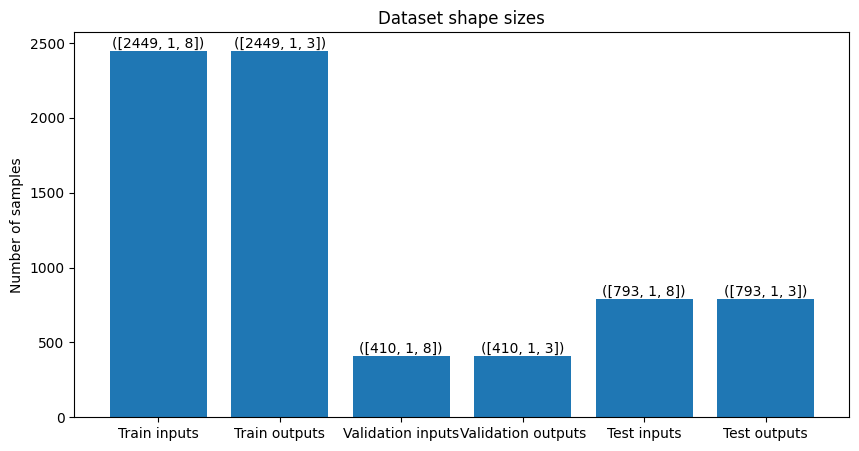

In [ ]:
def visualize_data_shapes(train_inputs, train_outputs, val_inputs, val_outputs, test_inputs, test_outputs):
    data_shapes = [
        ('Train inputs', train_inputs.shape),
        ('Train outputs', train_outputs.shape),
        ('Validation inputs', val_inputs.shape),
        ('Validation outputs', val_outputs.shape),
        ('Test inputs', test_inputs.shape),
        ('Test outputs', test_outputs.shape)
    ]

    labels, shapes = zip(*data_shapes)

    plt.figure(figsize=(10, 5))
    plt.bar(labels, [shape[0] for shape in shapes])
    plt.ylabel('Number of samples')
    plt.title('Dataset shape sizes')

    for i, shape in enumerate(shapes):
        shape_str = str(shape).replace("torch.Size", "").strip("[]")  # Convert shape to string and remove "torch.Size"
        plt.text(i, shape[0], f"{shape_str}", ha='center', va='bottom')

    plt.show()

# Call the function with your data
visualize_data_shapes(train_inputs, train_outputs, val_inputs, val_outputs, test_inputs, test_outputs)

# LSTM Model Building

In [ ]:
class MyDataset(Dataset):
    def __init__(self, x, y):
        self.x = x
        self.y = y

    def __len__(self):
        return self.x.shape[0]

    def __getitem__(self, idx):
        return self.x[idx], self.y[idx]

In [ ]:
class LSTMModel(nn.Module):
    def __init__(self, input_size, hidden_size, output_size, num_layers, dropout):
        super(LSTMModel, self).__init__()
        self.hidden_size = hidden_size
        self.num_layers = num_layers
        self.dropout = dropout
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers=num_layers, batch_first=True, dropout=dropout)
        self.linear = nn.Linear(hidden_size, output_size)

        self.init_weights()

    def init_weights(self):
        for name, param in self.lstm.named_parameters():
            if 'weight_ih' in name:
                nn.init.xavier_uniform_(param.data)
            elif 'weight_hh' in name:
                nn.init.xavier_uniform_(param.data)
            elif 'bias' in name:
                param.data.fill_(0)

        nn.init.xavier_uniform_(self.linear.weight)
        nn.init.zeros_(self.linear.bias)

    def forward(self, input_seq):
        batch_size, seq_len, _ = input_seq.size()
        h0 = torch.zeros(self.num_layers, batch_size, self.hidden_size).to(input_seq.device)
        c0 = torch.zeros(self.num_layers, batch_size, self.hidden_size).to(input_seq.device)

        lstm_out, _ = self.lstm(input_seq, (h0, c0))
        output_seq = self.linear(lstm_out.contiguous().view(-1, self.hidden_size))
        output_seq = output_seq.view(batch_size, seq_len, -1)

        return output_seq

In [ ]:
from torch.optim.lr_scheduler import ReduceLROnPlateau
# Add early stopping class
class EarlyStopping:
    def __init__(self, patience=5, delta=0.0001):
        self.patience = patience
        self.delta = delta
        self.best_loss = None
        self.counter = 0

    def __call__(self, val_loss):
        if self.best_loss is None:
            self.best_loss = val_loss
        elif self.best_loss - val_loss > self.delta:
            self.best_loss = val_loss
            self.counter = 0
        elif self.best_loss - val_loss <= self.delta:
            self.counter += 1
            if self.counter >= self.patience:
                return True
        return False

# Random Search for Best Hyperparameters

In [ ]:
# # Set the device
# device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [ ]:
# import random

# def sample_hyperparameters(space):
#     return {key: random.choice(values) for key, values in space.items()}

In [ ]:
# def train_model(hyperparameters):
#     # Unpack the hyperparameters
#     hidden_size = hyperparameters['hidden_size']
#     batch_size = hyperparameters['batch_size']
#     num_epochs = hyperparameters['num_epochs']
#     learning_rate = hyperparameters['learning_rate']
#     num_layers = hyperparameters['num_layers']
#     dropout = hyperparameters['dropout']
#     weight_decay = hyperparameters['weight_decay']
#     input_size = train_inputs.shape[-1]
#     output_size = train_outputs.shape[-1]
#     patience = 0

#     # Define datasets and data loaders for training and testing
#     train_dataset = MyDataset(train_inputs, train_outputs)
#     val_dataset = MyDataset(val_inputs, val_outputs)
#     test_dataset = MyDataset(test_inputs, test_outputs)
#     train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=False)
#     val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
#     test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

#     # Create model and optimizer
#     model = LSTMModel(input_size, hidden_size, output_size, num_layers, dropout).to(device)
#     optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate, weight_decay=weight_decay)
#     #optimizer = AdaBelief(model.parameters(), lr=learning_rate, print_change_log = False)
#     scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=0, verbose=True)
#     criterion = nn.MSELoss()

#     # Initialize early stopping
#     early_stopping = EarlyStopping(patience=patience)

#     train_losses, val_losses, test_losses = [], [], []

#     # Define the progress bar
#     progress_bar = tqdm(range(num_epochs), desc='Epoch', position=0)
#     # Train the model
#     for epoch in progress_bar:
#         train_loss = 0.0
#         for batch_x, batch_y in train_loader:
#             batch_x, batch_y = batch_x.to(device), batch_y.to(device)
#             optimizer.zero_grad()
#             output_seq = model(batch_x)
#             loss = criterion(output_seq, batch_y) 
#             loss.backward()
#             optimizer.step()
#             train_loss += loss.item() * batch_x.shape[0]
#         train_loss /= len(train_dataset)
#         train_losses.append(train_loss)

#         # Calculate validation loss
#         val_loss = 0.0
#         with torch.no_grad():
#             for batch_x, batch_y in val_loader:
#                 batch_x, batch_y = batch_x.to(device), batch_y.to(device)
#                 output_seq = model(batch_x)
#                 loss = criterion(output_seq, batch_y)
#                 val_loss += loss.item() * batch_x.shape[0]
#             val_losses.append(val_loss)
#             val_loss /= len(val_dataset)

#         scheduler.step(val_loss)  # Learning rate scheduling

#         # Test the model
#         test_loss = 0.0
#         test_predictions = []
#         with torch.no_grad():
#             for batch_x, batch_y in test_loader:
#                 batch_x, batch_y = batch_x.to(device), batch_y.to(device)
#                 output_seq = model(batch_x)
#                 loss = criterion(output_seq, batch_y)
#                 test_loss += loss.item() * batch_x.shape[0]
#                 test_predictions.append(output_seq.detach().cpu().numpy())

#             test_loss /= len(test_dataset)
#             test_losses.append(test_loss)

#         # Update the progress bar
#         progress_bar.set_postfix({'Train Loss': f'{train_loss:.6f}', 'Val Loss': f'{val_loss:.6f}', 'Test Loss': f'{test_loss:.6f}'})

#         # Check for early stopping
#         if early_stopping(val_loss):
#             print(f"Early stopping after {epoch+1} epochs")
#             break

#         # After the training loop and early stopping check, save the model
#         torch.save(model.state_dict(), "lstm_model.pth")

#         test_predictions = np.concatenate(test_predictions)

#         test_outputs_np = test_outputs.numpy()
#         test_outputs_np

#         # Flatten the denormalized test predictions and actual outputs
#         test_predictions_flat = test_predictions.flatten()
#         test_outputs_flat = test_outputs_np.flatten()

#         # Calculate R^2 score
#         test_r2 = r2_score(test_outputs_flat, test_predictions_flat)

#     # Return the best validation loss
#     return test_r2

In [ ]:
# # Define the hyperparameter search space
# hyperparameter_space = {
#     'hidden_size': [ 256, 512],
#     'batch_size': [1, 4, 8],
#     'num_epochs': [20, 30],
#     'learning_rate': [1e-3, 1e-4, 1e-5],
#     'num_layers': [1, 2],
#     'dropout': [0.0, 0.1, 0.2],
#     'weight_decay': [0.0, 1e-5, 1e-4, 1e-6],
# }

# input_size = train_inputs.shape[-1]
# output_size = train_outputs.shape[-1]

# # Number of random search iterations
# num_iterations = 20

# # Track the best R2 score and corresponding hyperparameters
# best_r2 = -1e9
# best_hyperparameters = None

# # Initialize an empty DataFrame for storing the results
# search_df = pd.DataFrame(columns=['input_size', 'output_size', 'hidden_size', 'batch_size', 'num_epochs', 'learning_rate', 'num_layers', 'dropout', 'weight_decay', 'test_r2'])

# # Perform random search
# for i in range(num_iterations):
#     print('--------------------------------------------------------------------------------------------------------------------------')
#     print(f"Random search iteration {i+1}/{num_iterations}")

#     # Sample random hyperparameters
#     hyperparameters = {k: random.choice(v) for k, v in hyperparameter_space.items()}
#     print(f"Trying hyperparameters: {hyperparameters}")

#     # Train the model and get the test R2 score
#     test_r2 = train_model(hyperparameters)
#     print(f"Test R2 score: {test_r2}")

#     # Update the best R2 score and hyperparameters if necessary
#     if test_r2 > best_r2:
#         best_r2 = test_r2
#         best_hyperparameters = hyperparameters
#         print(f"New best R2 score: {best_r2}")
#         print(f"New best hyperparameters: {best_hyperparameters}")

#     # Append the results to the search_df DataFrame with a custom index
#     results = {
#         'input_size': input_size,
#         'output_size': output_size,
#         'hidden_size': hyperparameters['hidden_size'],
#         'batch_size': hyperparameters['batch_size'],
#         'num_epochs': hyperparameters['num_epochs'],
#         'learning_rate': hyperparameters['learning_rate'],
#         'num_layers': hyperparameters['num_layers'],
#         'dropout': hyperparameters['dropout'],
#         'weight_decay': hyperparameters['weight_decay'],
#         'test_r2': test_r2
#     }
#     index_name = f'Trial {i+1}'
#     search_df = pd.concat([search_df, pd.DataFrame(results, index=[index_name])])

# print("Random search completed")
# print(f"Best R2 score: {best_r2}")
# print(f"Best hyperparameters: {best_hyperparameters}")



--------------------------------------------------------------------------------------------------------------------------
Random search iteration 1/20
Trying hyperparameters: {'hidden_size': 512, 'batch_size': 8, 'num_epochs': 20, 'learning_rate': 1e-05, 'num_layers': 1, 'dropout': 0.0, 'weight_decay': 1e-05}


Epoch:  45%|████▌     | 9/20 [00:40<00:49,  4.50s/it, Train Loss=0.013950, Val Loss=0.016436, Test Loss=0.019366]
/usr/local/lib/python3.9/dist-packages/torch/nn/modules/rnn.py:71: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "


Early stopping after 10 epochs
Test R2 score: 0.5248087763477367
New best R2 score: 0.5248087763477367
New best hyperparameters: {'hidden_size': 512, 'batch_size': 8, 'num_epochs': 20, 'learning_rate': 1e-05, 'num_layers': 1, 'dropout': 0.0, 'weight_decay': 1e-05}
--------------------------------------------------------------------------------------------------------------------------
Random search iteration 2/20
Trying hyperparameters: {'hidden_size': 512, 'batch_size': 8, 'num_epochs': 30, 'learning_rate': 1e-05, 'num_layers': 1, 'dropout': 0.1, 'weight_decay': 0.0}


Epoch:  30%|███       | 9/30 [00:51<02:00,  5.75s/it, Train Loss=0.013633, Val Loss=0.016233, Test Loss=0.019193]


Early stopping after 10 epochs
Test R2 score: 0.5299324084342365
New best R2 score: 0.5299324084342365
New best hyperparameters: {'hidden_size': 512, 'batch_size': 8, 'num_epochs': 30, 'learning_rate': 1e-05, 'num_layers': 1, 'dropout': 0.1, 'weight_decay': 0.0}
--------------------------------------------------------------------------------------------------------------------------
Random search iteration 3/20
Trying hyperparameters: {'hidden_size': 256, 'batch_size': 8, 'num_epochs': 30, 'learning_rate': 0.0001, 'num_layers': 1, 'dropout': 0.0, 'weight_decay': 1e-06}


Epoch:   3%|▎         | 1/30 [00:01<00:56,  1.94s/it, Train Loss=0.013891, Val Loss=0.019263, Test Loss=0.023012]


Epoch 00002: reducing learning rate of group 0 to 1.0000e-05.
Early stopping after 2 epochs
Test R2 score: 0.5036029003333522
--------------------------------------------------------------------------------------------------------------------------
Random search iteration 4/20
Trying hyperparameters: {'hidden_size': 256, 'batch_size': 1, 'num_epochs': 30, 'learning_rate': 0.0001, 'num_layers': 2, 'dropout': 0.2, 'weight_decay': 0.0001}


Epoch:  17%|█▋        | 5/30 [01:11<05:58, 14.33s/it, Train Loss=0.007451, Val Loss=0.010196, Test Loss=0.012369]

Epoch 00006: reducing learning rate of group 0 to 1.0000e-05.


Epoch:  17%|█▋        | 5/30 [01:25<07:07, 17.10s/it, Train Loss=0.007362, Val Loss=0.010209, Test Loss=0.012389]


Early stopping after 6 epochs
Test R2 score: 0.6946425393396575
New best R2 score: 0.6946425393396575
New best hyperparameters: {'hidden_size': 256, 'batch_size': 1, 'num_epochs': 30, 'learning_rate': 0.0001, 'num_layers': 2, 'dropout': 0.2, 'weight_decay': 0.0001}
--------------------------------------------------------------------------------------------------------------------------
Random search iteration 5/20
Trying hyperparameters: {'hidden_size': 256, 'batch_size': 4, 'num_epochs': 20, 'learning_rate': 0.0001, 'num_layers': 2, 'dropout': 0.2, 'weight_decay': 1e-06}


Epoch:  25%|██▌       | 5/20 [00:23<01:10,  4.67s/it, Train Loss=0.007726, Val Loss=0.009711, Test Loss=0.012042]


Early stopping after 6 epochs
Test R2 score: 0.6929883976895659
--------------------------------------------------------------------------------------------------------------------------
Random search iteration 6/20
Trying hyperparameters: {'hidden_size': 256, 'batch_size': 8, 'num_epochs': 30, 'learning_rate': 1e-05, 'num_layers': 2, 'dropout': 0.0, 'weight_decay': 1e-06}


Epoch:  17%|█▋        | 5/30 [00:12<01:00,  2.40s/it, Train Loss=0.014301, Val Loss=0.017043, Test Loss=0.020078]


Epoch 00006: reducing learning rate of group 0 to 1.0000e-06.
Early stopping after 6 epochs
Test R2 score: 0.5209049118186223
--------------------------------------------------------------------------------------------------------------------------
Random search iteration 7/20
Trying hyperparameters: {'hidden_size': 512, 'batch_size': 1, 'num_epochs': 20, 'learning_rate': 1e-05, 'num_layers': 1, 'dropout': 0.0, 'weight_decay': 0.0}


Epoch:   5%|▌         | 1/20 [00:41<13:02, 41.19s/it, Train Loss=0.092422, Val Loss=0.017305, Test Loss=0.020209]

Epoch 00002: reducing learning rate of group 0 to 1.0000e-06.


Epoch:   5%|▌         | 1/20 [01:31<29:01, 91.66s/it, Train Loss=0.012405, Val Loss=0.018479, Test Loss=0.022258]


Early stopping after 2 epochs
Test R2 score: 0.5011147966508214
--------------------------------------------------------------------------------------------------------------------------
Random search iteration 8/20
Trying hyperparameters: {'hidden_size': 256, 'batch_size': 4, 'num_epochs': 20, 'learning_rate': 0.001, 'num_layers': 2, 'dropout': 0.1, 'weight_decay': 0.0001}


Epoch:  10%|█         | 2/20 [00:12<01:52,  6.27s/it, Train Loss=0.009044, Val Loss=0.013410, Test Loss=0.015651]


Epoch 00003: reducing learning rate of group 0 to 1.0000e-04.
Early stopping after 3 epochs
Test R2 score: 0.6431878809044307
--------------------------------------------------------------------------------------------------------------------------
Random search iteration 9/20
Trying hyperparameters: {'hidden_size': 256, 'batch_size': 8, 'num_epochs': 30, 'learning_rate': 1e-05, 'num_layers': 1, 'dropout': 0.0, 'weight_decay': 0.0}


Epoch:  40%|████      | 12/30 [00:16<00:25,  1.41s/it, Train Loss=0.013474, Val Loss=0.015963, Test Loss=0.018892]
/usr/local/lib/python3.9/dist-packages/torch/nn/modules/rnn.py:71: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "


Early stopping after 13 epochs
Test R2 score: 0.5370302780022518
--------------------------------------------------------------------------------------------------------------------------
Random search iteration 10/20
Trying hyperparameters: {'hidden_size': 256, 'batch_size': 8, 'num_epochs': 30, 'learning_rate': 1e-05, 'num_layers': 1, 'dropout': 0.2, 'weight_decay': 0.0001}


Epoch:  37%|███▋      | 11/30 [00:09<00:17,  1.10it/s, Train Loss=0.013562, Val Loss=0.016060, Test Loss=0.018877]


Early stopping after 12 epochs
Test R2 score: 0.5388404692586864
--------------------------------------------------------------------------------------------------------------------------
Random search iteration 11/20
Trying hyperparameters: {'hidden_size': 512, 'batch_size': 4, 'num_epochs': 30, 'learning_rate': 1e-05, 'num_layers': 2, 'dropout': 0.0, 'weight_decay': 1e-05}


Epoch:  77%|███████▋  | 23/30 [07:08<02:10, 18.65s/it, Train Loss=0.007225, Val Loss=0.009297, Test Loss=0.011692]


Early stopping after 24 epochs
Test R2 score: 0.7079516179441722
New best R2 score: 0.7079516179441722
New best hyperparameters: {'hidden_size': 512, 'batch_size': 4, 'num_epochs': 30, 'learning_rate': 1e-05, 'num_layers': 2, 'dropout': 0.0, 'weight_decay': 1e-05}
--------------------------------------------------------------------------------------------------------------------------
Random search iteration 12/20
Trying hyperparameters: {'hidden_size': 512, 'batch_size': 4, 'num_epochs': 20, 'learning_rate': 0.001, 'num_layers': 2, 'dropout': 0.0, 'weight_decay': 1e-06}


Epoch:  10%|█         | 2/20 [00:33<05:04, 16.92s/it, Train Loss=0.009518, Val Loss=0.011934, Test Loss=0.014020]

Epoch 00003: reducing learning rate of group 0 to 1.0000e-04.


Epoch:  10%|█         | 2/20 [00:50<07:37, 25.43s/it, Train Loss=0.009002, Val Loss=0.013343, Test Loss=0.015345]
/usr/local/lib/python3.9/dist-packages/torch/nn/modules/rnn.py:71: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "


Early stopping after 3 epochs
Test R2 score: 0.6538928427387265
--------------------------------------------------------------------------------------------------------------------------
Random search iteration 13/20
Trying hyperparameters: {'hidden_size': 256, 'batch_size': 8, 'num_epochs': 20, 'learning_rate': 1e-05, 'num_layers': 1, 'dropout': 0.2, 'weight_decay': 1e-06}


Epoch:  55%|█████▌    | 11/20 [00:10<00:08,  1.05it/s, Train Loss=0.013553, Val Loss=0.015907, Test Loss=0.018783]
/usr/local/lib/python3.9/dist-packages/torch/nn/modules/rnn.py:71: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "


Early stopping after 12 epochs
Test R2 score: 0.5414649385690418
--------------------------------------------------------------------------------------------------------------------------
Random search iteration 14/20
Trying hyperparameters: {'hidden_size': 512, 'batch_size': 8, 'num_epochs': 20, 'learning_rate': 1e-05, 'num_layers': 1, 'dropout': 0.2, 'weight_decay': 1e-05}


Epoch:  40%|████      | 8/20 [00:26<00:40,  3.35s/it, Train Loss=0.013937, Val Loss=0.016301, Test Loss=0.019103]


Early stopping after 9 epochs
Test R2 score: 0.5349672000573111
--------------------------------------------------------------------------------------------------------------------------
Random search iteration 15/20
Trying hyperparameters: {'hidden_size': 512, 'batch_size': 4, 'num_epochs': 30, 'learning_rate': 0.0001, 'num_layers': 2, 'dropout': 0.2, 'weight_decay': 1e-06}


Epoch:  17%|█▋        | 5/30 [01:51<09:18, 22.35s/it, Train Loss=0.007475, Val Loss=0.008993, Test Loss=0.011134]


Early stopping after 6 epochs
Test R2 score: 0.7204379545148574
New best R2 score: 0.7204379545148574
New best hyperparameters: {'hidden_size': 512, 'batch_size': 4, 'num_epochs': 30, 'learning_rate': 0.0001, 'num_layers': 2, 'dropout': 0.2, 'weight_decay': 1e-06}
--------------------------------------------------------------------------------------------------------------------------
Random search iteration 16/20
Trying hyperparameters: {'hidden_size': 256, 'batch_size': 1, 'num_epochs': 30, 'learning_rate': 0.001, 'num_layers': 2, 'dropout': 0.1, 'weight_decay': 0.0}


Epoch:  27%|██▋       | 8/30 [02:52<07:55, 21.63s/it, Train Loss=0.005752, Val Loss=0.007784, Test Loss=0.009416]

Epoch 00009: reducing learning rate of group 0 to 1.0000e-04.


Epoch:  27%|██▋       | 8/30 [03:15<08:56, 24.38s/it, Train Loss=0.005554, Val Loss=0.007835, Test Loss=0.009278]
/usr/local/lib/python3.9/dist-packages/torch/nn/modules/rnn.py:71: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "


Early stopping after 9 epochs
Test R2 score: 0.7675614281366893
New best R2 score: 0.7675614281366893
New best hyperparameters: {'hidden_size': 256, 'batch_size': 1, 'num_epochs': 30, 'learning_rate': 0.001, 'num_layers': 2, 'dropout': 0.1, 'weight_decay': 0.0}
--------------------------------------------------------------------------------------------------------------------------
Random search iteration 17/20
Trying hyperparameters: {'hidden_size': 512, 'batch_size': 4, 'num_epochs': 20, 'learning_rate': 0.0001, 'num_layers': 1, 'dropout': 0.1, 'weight_decay': 0.0}


Epoch:  50%|█████     | 10/20 [01:30<01:30,  9.09s/it, Train Loss=0.006869, Val Loss=0.008447, Test Loss=0.010829]
/usr/local/lib/python3.9/dist-packages/torch/nn/modules/rnn.py:71: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "


Early stopping after 11 epochs
Test R2 score: 0.7300526545971978
--------------------------------------------------------------------------------------------------------------------------
Random search iteration 18/20
Trying hyperparameters: {'hidden_size': 512, 'batch_size': 4, 'num_epochs': 30, 'learning_rate': 0.001, 'num_layers': 1, 'dropout': 0.2, 'weight_decay': 0.0001}


Epoch:   7%|▋         | 2/30 [00:11<02:35,  5.56s/it, Train Loss=0.008630, Val Loss=0.010294, Test Loss=0.012197]

Epoch 00003: reducing learning rate of group 0 to 1.0000e-04.


Epoch:   7%|▋         | 2/30 [00:16<03:55,  8.41s/it, Train Loss=0.008294, Val Loss=0.010405, Test Loss=0.012355]


Early stopping after 3 epochs
Test R2 score: 0.6989026457852798
--------------------------------------------------------------------------------------------------------------------------
Random search iteration 19/20
Trying hyperparameters: {'hidden_size': 512, 'batch_size': 8, 'num_epochs': 30, 'learning_rate': 1e-05, 'num_layers': 1, 'dropout': 0.0, 'weight_decay': 1e-05}


Epoch:  30%|███       | 9/30 [00:30<01:10,  3.37s/it, Train Loss=0.013372, Val Loss=0.015930, Test Loss=0.018800]


Early stopping after 10 epochs
Test R2 score: 0.5385652436363074
--------------------------------------------------------------------------------------------------------------------------
Random search iteration 20/20
Trying hyperparameters: {'hidden_size': 256, 'batch_size': 1, 'num_epochs': 30, 'learning_rate': 0.0001, 'num_layers': 2, 'dropout': 0.2, 'weight_decay': 1e-05}


Epoch:  13%|█▎        | 4/30 [01:02<06:51, 15.82s/it, Train Loss=0.007268, Val Loss=0.009613, Test Loss=0.011647]

Epoch 00005: reducing learning rate of group 0 to 1.0000e-05.


Epoch:  13%|█▎        | 4/30 [01:18<08:27, 19.52s/it, Train Loss=0.007128, Val Loss=0.009713, Test Loss=0.011660]

Early stopping after 5 epochs
Test R2 score: 0.712474782567427
Random search completed
Best R2 score: 0.7675614281366893
Best hyperparameters: {'hidden_size': 256, 'batch_size': 1, 'num_epochs': 30, 'learning_rate': 0.001, 'num_layers': 2, 'dropout': 0.1, 'weight_decay': 0.0}


# Training, Validation & Testing

In [ ]:
# Set the device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [ ]:
# Define hyperparameters
input_size = train_inputs.shape[-1]
output_size = train_outputs.shape[-1]
hidden_size = 512
batch_size = 1
num_epochs = 30
learning_rate = 0.001
num_layers = 1
dropout = 0.0
weight_decay = 1e-06  # L2 regularization
patience = 0  # early stopping

# Define datasets and data loaders for training and testing
train_dataset = MyDataset(train_inputs, train_outputs)
val_dataset = MyDataset(val_inputs, val_outputs)
test_dataset = MyDataset(test_inputs, test_outputs)
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=False)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Create model and optimizer
model = LSTMModel(input_size, hidden_size, output_size, num_layers, dropout).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate, weight_decay=weight_decay)
scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=0, verbose=True)
criterion = nn.MSELoss()

In [ ]:
# Initialize early stopping
early_stopping = EarlyStopping(patience=patience)

train_losses, val_losses, test_losses = [], [], []

# Define the progress bar
progress_bar = tqdm(range(num_epochs), desc='Epoch', position=0)
# Train the model
for epoch in progress_bar:
    train_loss = 0.0
    for batch_x, batch_y in train_loader:
        batch_x, batch_y = batch_x.to(device), batch_y.to(device)
        optimizer.zero_grad()
        output_seq = model(batch_x)
        loss = criterion(output_seq, batch_y) 
        loss.backward()
        optimizer.step()
        train_loss += loss.item() * batch_x.shape[0]
    train_loss /= len(train_dataset)
    train_losses.append(train_loss)

    # Calculate validation loss
    val_loss = 0.0
    with torch.no_grad():
        for batch_x, batch_y in val_loader:
            batch_x, batch_y = batch_x.to(device), batch_y.to(device)
            output_seq = model(batch_x)
            loss = criterion(output_seq, batch_y)
            val_loss += loss.item() * batch_x.shape[0]
        val_losses.append(val_loss)
        val_loss /= len(val_dataset)

    scheduler.step(val_loss)  # Learning rate scheduling

    # Test the model
    test_loss = 0.0
    test_predictions = []
    with torch.no_grad():
        for batch_x, batch_y in test_loader:
            batch_x, batch_y = batch_x.to(device), batch_y.to(device)
            output_seq = model(batch_x)
            loss = criterion(output_seq, batch_y)
            test_loss += loss.item() * batch_x.shape[0]
            test_predictions.append(output_seq.detach().cpu().numpy())

        test_loss /= len(test_dataset)
        test_losses.append(test_loss)

    # Update the progress bar
    progress_bar.set_postfix({'Train Loss': f'{train_loss:.6f}', 'Val Loss': f'{val_loss:.6f}', 'Test Loss': f'{test_loss:.6f}'})

    # Check for early stopping
    if early_stopping(val_loss):
        print(f"Early stopping after {epoch+1} epochs")
        break

# After the training loop and early stopping check, save the model
torch.save(model.state_dict(), "lstm_model.pth")

test_predictions = np.concatenate(test_predictions)

Epoch:  33%|███▎      | 10/30 [01:05<02:10,  6.50s/it, Train Loss=0.005150, Val Loss=0.006807, Test Loss=0.007881]

Early stopping after 11 epochs


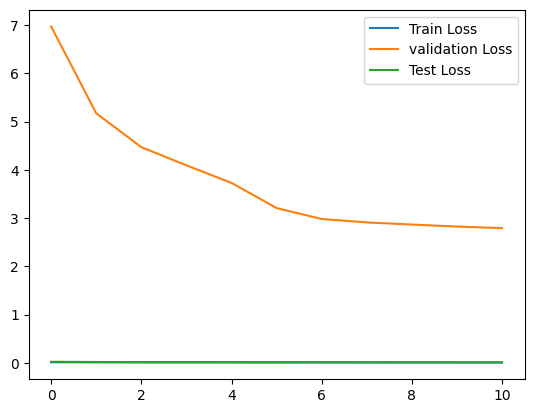

In [ ]:
# Plot the train and test losses
plt.plot(train_losses, label='Train Loss')
plt.plot(val_losses, label='validation Loss')
plt.plot(test_losses, label='Test Loss')
plt.legend()
plt.show()

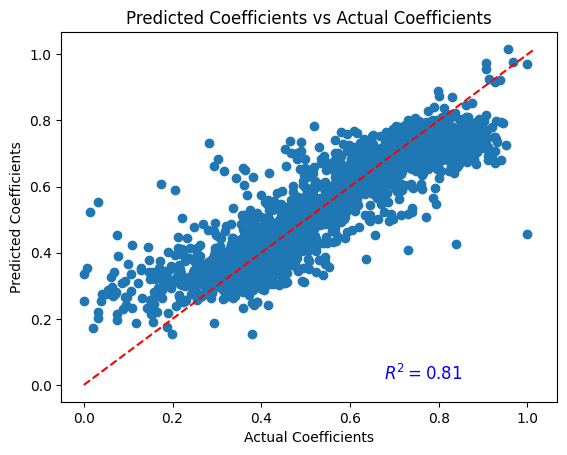

In [ ]:
#Convert output data from tensors to numpy
train_outputs_np = train_outputs.numpy()
val_outputs_np = val_outputs.numpy()
test_outputs_np = test_outputs.numpy()


# Flatten the denormalized test predictions and actual outputs
test_predictions_flat = test_predictions.flatten()
test_outputs_flat = test_outputs_np.flatten()

# r2 score for predicted & actual 2nd order coefficients
r2_coef = r2_score(test_outputs_flat, test_predictions_flat)

plt.scatter(test_outputs_flat, test_predictions_flat)
plt.xlabel('Actual Coefficients')
plt.ylabel('Predicted Coefficients')
plt.title('Predicted Coefficients vs Actual Coefficients')

# Add a diagonal line to visualize a perfect match between actual and predicted values
min_val = min(test_outputs_flat.min(), test_predictions_flat.min())
max_val = max(test_outputs_flat.max(), test_predictions_flat.max())
plt.plot([min_val, max_val], [min_val, max_val], color='red', linestyle='--')

# Add the r2 score to the plot
plt.text(max_val - (max_val - min_val) / 3, max_val - 1, r'$R^2 = {:.2f}$'.format(r2_coef), fontsize=12, color='blue')

plt.show()

In [ ]:
# Denormalization the predicted & actual coefficients dataset
test_predictions_denorm = scaler.inverse_transform(test_predictions.reshape(-1, test_predictions.shape[-1]))
test_predictions_denorm = np.reshape(test_predictions_denorm, test_predictions.shape)

train_outputs_np_denorm = scaler.inverse_transform(train_outputs_np.reshape(-1, train_outputs_np.shape[-1]))
train_outputs_np_denorm = np.reshape(train_outputs_np_denorm, train_outputs_np.shape)

val_outputs_np_denorm = scaler.inverse_transform(val_outputs_np.reshape(-1, val_outputs_np.shape[-1]))
val_outputs_np_denorm = np.reshape(val_outputs_np_denorm, val_outputs_np.shape)

test_outputs_np_denorm = scaler.inverse_transform(test_outputs_np.reshape(-1, test_outputs_np.shape[-1]))
test_outputs_np_denorm = np.reshape(test_outputs_np_denorm, test_outputs_np.shape)

In [ ]:
# Insert the identities (sample name, layer number & curve number) of the curves back into the datasets

train_outputs_np_denorm_labelled = np.concatenate((train_outputs_np_denorm, train_identity[:, np.newaxis]), axis=-1)
val_outputs_np_denorm_labelled = np.concatenate((val_outputs_np_denorm, val_identity[:, np.newaxis]), axis=-1)

test_predictions_denorm_labelled = np.concatenate((test_predictions_denorm, test_identity[:, np.newaxis]), axis=-1)
test_outputs_np_denorm_labelled = np.concatenate((test_outputs_np_denorm, test_identity[:, np.newaxis]), axis=-1)


In [ ]:
# Convert the arrays to float type
pred_coef = test_predictions_denorm_labelled[:, :, :3].astype(float)
test_outputs_coef = test_outputs_np_denorm_labelled[:, :, :3].astype(float)
train_outputs_coef = train_outputs_np_denorm_labelled[:, :, :3].astype(float)
val_outputs_coef = val_outputs_np_denorm_labelled[:, :, :3].astype(float)

In [ ]:
pred_coef

array([[[-4.7270354e-04, -2.7071646e-01,  5.5218900e+02]],

       [[-5.2484080e-04, -4.1093620e-01,  4.5413220e+02]],

       [[-5.3102950e-04, -4.8067072e-01,  4.2483920e+02]],

       ...,

       [[-4.7136433e-04, -2.1043230e-01,  1.0882212e+03]],

       [[-4.4455886e-04, -2.1987323e-01,  1.0231510e+03]],

       [[-4.2415631e-04, -1.5634184e-01,  1.0475381e+03]]])

# Curves Plotting

In [ ]:
class PlotGraph():
    def __init__(self, coeffs, point_chains, root_points_list, name, layer_number, colors=None):
        self.coeffs = coeffs
        self.point_chains = point_chains
        self.root_points_list = root_points_list
        self.name = name
        self.layer_number = layer_number
        self.colors = colors if colors else ['blue'] * len(coeffs)

    def plot_curve(self, ax, x1, x2, coeff, label=None, color='blue'):
        p = np.poly1d(coeff)
        xp = np.linspace(x1, x2, 50)
        ax.plot(xp, p(xp), '-', color=color, label=label)

    def plot_ax(self):
        fig, ax = plt.subplots(figsize=(10, 10))  # Increase the figure size
        for coeff_set, point_chain_set, root_points_set, color_set in zip(self.coeffs, self.point_chains, self.root_points_list, self.colors):
            for i in range(min(len(coeff_set), len(point_chain_set), len(root_points_set))):
                label = f"{self.name} {self.layer_number} Actual" if i == 0 and color_set == 'green' else f"{self.name} {self.layer_number} Predicted" if i == 0 and color_set == 'red' else None
                self.plot_curve(ax, point_chain_set[i], np.max(root_points_set[i]), coeff_set[i], label=label, color=color_set)
        ax = plt.gca()
        ax.axvline(0)
        ax.axhline(0)
        ax.set_aspect('equal', adjustable='box')

        # Move the legend outside the plot to the right
        ax.legend(loc='upper left', bbox_to_anchor=(1, 1), borderaxespad=0)
                
        plt.show()

def get_plot_graph_without_points(coeff, point_chain, root_points, name, layer_number):
    plt = PlotGraph(coeff, point_chain, root_points, name, layer_number)
    plt.plot_ax()     

In [ ]:
def calibrate_x_position(x,y):
    coefficient=np.polyfit(x, y, 2,full=False)
    x_offset = np.roots(np.poly1d(coefficient).deriv())[0]
    return x_offset

In [ ]:
# Dataframe to store the actual vs predicted height & waivness value for each curves
shape_df = pd.DataFrame(columns=['sample_name', 'layer_num', 'curve_num', 'actual_height', 'predicted_height', 'actual_waviness', 'predicted_waviness'])

unique_sample_numbers = np.unique(test_predictions_denorm_labelled[:, 0, 3])
unique_layer_numbers = np.unique(test_predictions_denorm_labelled[:, 0, 4])

for sample_number in unique_sample_numbers:
    for layer_number in unique_layer_numbers:
        sample_mask_pred = test_predictions_denorm_labelled[:, 0, 3] == sample_number
        layer_mask_pred = test_predictions_denorm_labelled[:, 0, 4] == layer_number
        mask_pred = np.logical_and(sample_mask_pred, layer_mask_pred)

        sample_mask_act = test_outputs_np_denorm_labelled[:, 0, 3] == sample_number
        layer_mask_act = test_outputs_np_denorm_labelled[:, 0, 4] == layer_number
        mask_act = np.logical_and(sample_mask_act, layer_mask_act)

        if np.any(mask_pred) or np.any(mask_act):
            coef_pred = []
            root_points_pred = []
            cross_points_pred = []
            point_chain_pred = []
            coef_act = []
            root_points_act = []
            cross_points_act = []
            point_chain_act = []
            hatch_spacing = process_parameters.loc[sample_number, 'Hatching Spacing']
            x_range = np.arange(-10, 11)

            if np.any(mask_pred):
                test_filtered_pred = test_predictions_denorm_labelled[mask_pred]
                pred_coef_filtered = pred_coef[mask_pred]

                for i in range(len(test_filtered_pred)):
                    try:
                        xy_offset = hatch_spacing * int(test_filtered_pred[i,0,5])
                        a, b, c = pred_coef_filtered[i][0]
                        y_vals = a * x_range ** 2 + b * x_range + c
                        points = np.stack((x_range, y_vals), axis=-1)
                        coefficient = np.polyfit(points[:, 0:1].flatten()+xy_offset, points[:, 1:2].flatten(), 2, full=False)
                        p = np.poly1d(coefficient)
                        roots = np.roots(coefficient)
                        root_points_pred.append(roots)
                        coef_pred.append(coefficient)
                        if i != 0:
                            intersect_point = np.roots(coef_pred[i - 1] - coef_pred[i])
                            intersect_point = intersect_point[p(intersect_point) > 0]
                            cross_points_pred.append(np.max(intersect_point[(intersect_point >= np.min(root_points_pred[i-1])) & (intersect_point <= np.max(root_points_pred[i-1]))]))
                    except (ValueError, IndexError) as e:
                        print(f"Error occurred for Sample Number: {sample_number}, Layer Number: {layer_number}")
                        continue

                point_chain_pred = np.concatenate(([np.min(root_points_pred[0])], cross_points_pred, [np.max(root_points_pred[-1])]))
                #plt_pred = PlotGraph(coef_pred, point_chain_pred, root_points_pred, sample_number, layer_number, color='red')
            
            if np.any(mask_act):
                test_filtered_act = test_outputs_np_denorm_labelled[mask_act]
                act_coef_filtered = test_outputs_coef[mask_act]

                for i in range(len(test_filtered_act)):
                    try:
                        xy_offset = hatch_spacing * int(test_filtered_act[i,0,5])
                        a, b, c = act_coef_filtered[i][0]
                        y_vals = a * x_range ** 2 + b * x_range + c
                        points = np.stack((x_range, y_vals), axis=-1)
                        coefficient = np.polyfit(points[:, 0:1].flatten()+xy_offset, points[:, 1:2].flatten(), 2, full=False)
                        if np.any(~np.isfinite(coefficient)):
                            raise ValueError("Invalid coefficient array")
                        p = np.poly1d(coefficient)
                        roots = np.roots(coefficient)
                        root_points_act.append(roots)
                        coef_act.append(coefficient)
                        if i != 0:
                            intersect_point = np.roots(coef_act[i - 1] - coef_act[i])
                            intersect_point = intersect_point[p(intersect_point) > 0]
                            cross_points_act.append(np.max(intersect_point[(intersect_point >= np.min(root_points_act[i-1])) & (intersect_point <= np.max(root_points_act[i-1]))]))
                    except (ValueError, IndexError) as e:
                        print(f"Error occurred for Sample Number: {sample_number}, Layer Number: {layer_number}")
                        continue

                point_chain_act = np.concatenate(([np.min(root_points_act[0])], cross_points_act, [np.max(root_points_act[-1])]))
                #plt_act = PlotGraph(coef_act, point_chain_act, root_points_act, sample_number, layer_number, color='green')
            
            if np.any(mask_act) and np.any(mask_pred):
              heights_pred = []
              heights_act = []
              waviness_pred = []
              waviness_act = []

              for i, (coef_p, coef_a) in enumerate(zip(coef_pred, coef_act)):
                  p_pred = np.poly1d(coef_p)
                  p_act = np.poly1d(coef_a)

                  # Obtain height        
                  max_height_pred = p_pred(np.roots(p_pred.deriv()))[0]
                  max_height_act = p_act(np.roots(p_act.deriv()))[0]

                  # Obtain waviness 
                  if i != 0:
                      intersect_point_pred = np.roots(coef_pred[i - 1] - coef_pred[i])
                      intersect_point_pred = intersect_point_pred[p_pred(intersect_point_pred) > 0]
                      cross_point_pred = np.max(intersect_point_pred[(intersect_point_pred >= np.min(root_points_pred[i-1])) & (intersect_point_pred <= np.max(root_points_pred[i-1]))])

                      intersect_point_act = np.roots(coef_act[i - 1] - coef_act[i])
                      intersect_point_act = intersect_point_act[p_act(intersect_point_act) > 0]
                      cross_point_act = np.max(intersect_point_act[(intersect_point_act >= np.min(root_points_act[i-1])) & (intersect_point_act <= np.max(root_points_act[i-1]))])

                      waviness_pred.append(max_height_pred - p_pred(cross_point_pred))
                      waviness_act.append(max_height_act - p_act(cross_point_act))

                  heights_pred.append(max_height_pred)
                  heights_act.append(max_height_act)

                  row_data = pd.DataFrame([{
                      'sample_name': sample_number,
                      'layer_num': layer_number,
                      'curve_num': i,
                      'predicted_height': max_height_pred,
                      'actual_height': max_height_act,
                      'predicted_waviness': waviness_pred[-1] if i != 0 else 0,
                      'actual_waviness': waviness_act[-1] if i != 0 else 0
                  }])

                  shape_df = pd.concat([shape_df, row_data], ignore_index=True)

In [ ]:
# Dataframe to store the actual vs predicted height & waivness value for each curves
shape_df = pd.DataFrame(columns=['sample_name', 'layer_num', 'curve_num', 'actual_height', 'predicted_height', 'actual_waviness', 'predicted_waviness'])

unique_sample_numbers = np.unique(test_predictions_denorm_labelled[:, 0, 3])
unique_layer_numbers = np.unique(test_predictions_denorm_labelled[:, 0, 4])

for sample_number in unique_sample_numbers:
    for layer_number in unique_layer_numbers:
        sample_mask_pred = test_predictions_denorm_labelled[:, 0, 3] == sample_number
        layer_mask_pred = test_predictions_denorm_labelled[:, 0, 4] == layer_number
        mask_pred = np.logical_and(sample_mask_pred, layer_mask_pred)

        sample_mask_act = test_outputs_np_denorm_labelled[:, 0, 3] == sample_number
        layer_mask_act = test_outputs_np_denorm_labelled[:, 0, 4] == layer_number
        mask_act = np.logical_and(sample_mask_act, layer_mask_act)

        if np.any(mask_pred) or np.any(mask_act):
            coef_pred = []
            root_points_pred = []
            cross_points_pred = []
            point_chain_pred = []
            coef_act = []
            root_points_act = []
            cross_points_act = []
            point_chain_act = []
            hatch_spacing = process_parameters.loc[sample_number, 'Hatching Spacing']
            x_range = np.arange(-10, 11)

            if np.any(mask_pred):
                test_filtered_pred = test_predictions_denorm_labelled[mask_pred]
                pred_coef_filtered = pred_coef[mask_pred]

                for i in range(len(test_filtered_pred)):
                    try:
                        xy_offset = hatch_spacing * int(test_filtered_pred[i,0,5])
                        a, b, c = pred_coef_filtered[i][0]
                        y_vals = a * x_range ** 2 + b * x_range + c
                        points = np.stack((x_range, y_vals), axis=-1)
                        coefficient = np.polyfit(points[:, 0:1].flatten()+xy_offset, points[:, 1:2].flatten(), 2, full=False)
                        p = np.poly1d(coefficient)
                        roots = np.roots(coefficient)
                        root_points_pred.append(roots)
                        coef_pred.append(coefficient)
                        if i != 0:
                            intersect_point = np.roots(coef_pred[i - 1] - coef_pred[i])
                            intersect_point = intersect_point[p(intersect_point) > 0]
                            cross_points_pred.append(np.max(intersect_point[(intersect_point >= np.min(root_points_pred[i-1])) & (intersect_point <= np.max(root_points_pred[i-1]))]))
                    except (ValueError, IndexError) as e:
                        print(f"Error occurred for Sample Number: {sample_number}, Layer Number: {layer_number}")
                        continue

                point_chain_pred = np.concatenate(([np.min(root_points_pred[0])], cross_points_pred, [np.max(root_points_pred[-1])]))
                #plt_pred = PlotGraph(coef_pred, point_chain_pred, root_points_pred, sample_number, layer_number, color='red')
            
            if np.any(mask_act):
                test_filtered_act = test_outputs_np_denorm_labelled[mask_act]
                act_coef_filtered = test_outputs_coef[mask_act]

                for i in range(len(test_filtered_act)):
                    try:
                        xy_offset = hatch_spacing * int(test_filtered_act[i,0,5])
                        a, b, c = act_coef_filtered[i][0]
                        y_vals = a * x_range ** 2 + b * x_range + c
                        points = np.stack((x_range, y_vals), axis=-1)
                        coefficient = np.polyfit(points[:, 0:1].flatten()+xy_offset, points[:, 1:2].flatten(), 2, full=False)
                        if np.any(~np.isfinite(coefficient)):
                            raise ValueError("Invalid coefficient array")
                        p = np.poly1d(coefficient)
                        roots = np.roots(coefficient)
                        root_points_act.append(roots)
                        coef_act.append(coefficient)
                        if i != 0:
                            intersect_point = np.roots(coef_act[i - 1] - coef_act[i])
                            intersect_point = intersect_point[p(intersect_point) > 0]
                            cross_points_act.append(np.max(intersect_point[(intersect_point >= np.min(root_points_act[i-1])) & (intersect_point <= np.max(root_points_act[i-1]))]))
                    except (ValueError, IndexError) as e:
                        print(f"Error occurred for Sample Number: {sample_number}, Layer Number: {layer_number}")
                        continue

                point_chain_act = np.concatenate(([np.min(root_points_act[0])], cross_points_act, [np.max(root_points_act[-1])]))
                #plt_act = PlotGraph(coef_act, point_chain_act, root_points_act, sample_number, layer_number, color='green')
            
            if np.any(mask_act) and np.any(mask_pred):
              heights_pred = []
              heights_act = []
              waviness_pred = []
              waviness_act = []

              for i, (coef_p, coef_a) in enumerate(zip(coef_pred, coef_act)):
                  p_pred = np.poly1d(coef_p)
                  p_act = np.poly1d(coef_a)

                  # Obtain height        
                  max_height_pred = p_pred(np.roots(p_pred.deriv()))[0]
                  max_height_act = p_act(np.roots(p_act.deriv()))[0]

                  # Obtain waviness 
                  if i != 0:
                      intersect_point_pred = np.roots(coef_pred[i - 1] - coef_pred[i])
                      intersect_point_pred = intersect_point_pred[p_pred(intersect_point_pred) > 0]
                      cross_point_pred = np.max(intersect_point_pred[(intersect_point_pred >= np.min(root_points_pred[i-1])) & (intersect_point_pred <= np.max(root_points_pred[i-1]))])

                      intersect_point_act = np.roots(coef_act[i - 1] - coef_act[i])
                      intersect_point_act = intersect_point_act[p_act(intersect_point_act) > 0]
                      cross_point_act = np.max(intersect_point_act[(intersect_point_act >= np.min(root_points_act[i-1])) & (intersect_point_act <= np.max(root_points_act[i-1]))])

                      waviness_pred.append(max_height_pred - p_pred(cross_point_pred))
                      waviness_act.append(max_height_act - p_act(cross_point_act))

                  heights_pred.append(max_height_pred)
                  heights_act.append(max_height_act)

                  row_data = pd.DataFrame([{
                      'sample_name': sample_number,
                      'layer_num': layer_number,
                      'curve_num': i,
                      'predicted_height': max_height_pred,
                      'actual_height': max_height_act,
                      'predicted_waviness': waviness_pred[-1] if i != 0 else 0,
                      'actual_waviness': waviness_act[-1] if i != 0 else 0
                  }])

                  shape_df = pd.concat([shape_df, row_data], ignore_index=True)

In [ ]:
shape_df

,sample_name,layer_num,curve_num,actual_height,predicted_height,actual_waviness,predicted_waviness
0,E10,L1,0,594.550500,590.948706,0,0
1,E10,L1,1,529.056666,534.570192,24.79998,222.734381
2,E10,L2,0,543.222963,533.611095,0,0
3,E10,L2,1,558.294931,424.748827,195.249316,269.323635
4,E10,L3,0,849.599856,624.246183,0,0
...,...,...,...,...,...,...,...
788,E9,L4,1,1007.577601,1137.428758,83.412203,249.285228
789,E9,L5,0,1077.319910,1080.981165,0,0
790,E9,L5,1,975.238416,1111.707148,130.506475,207.877014
791,E9,L6,0,1043.062471,1050.337635,0,0


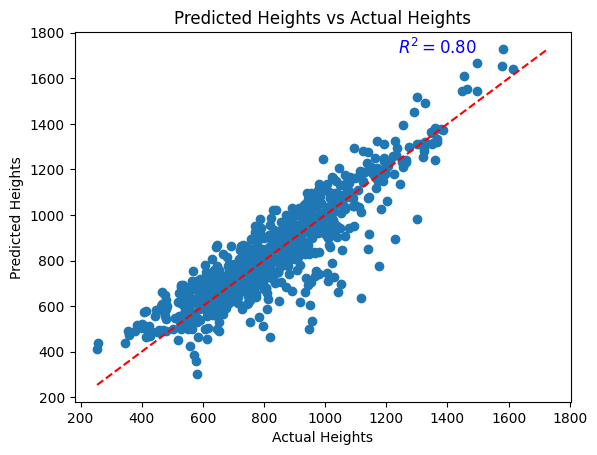

In [ ]:
# r2 score for predicted & actual heights

actual_heights = shape_df['actual_height'].values
predicted_heights = shape_df['predicted_height'].values

r2_heights = r2_score(actual_heights, predicted_heights)

plt.scatter(actual_heights, predicted_heights)
plt.xlabel('Actual Heights')
plt.ylabel('Predicted Heights')
plt.title('Predicted Heights vs Actual Heights')

# Add a diagonal line to visualize a perfect match between actual and predicted values
min_val = min(actual_heights.min(), predicted_heights.min())
max_val = max(actual_heights.max(), predicted_heights.max())
plt.plot([min_val, max_val], [min_val, max_val], color='red', linestyle='--')

# Add the r2 score to the plot
plt.text(max_val - (max_val - min_val) / 3, max_val - 20, r'$R^2 = {:.2f}$'.format(r2_heights), fontsize=12, color='blue')

plt.show()

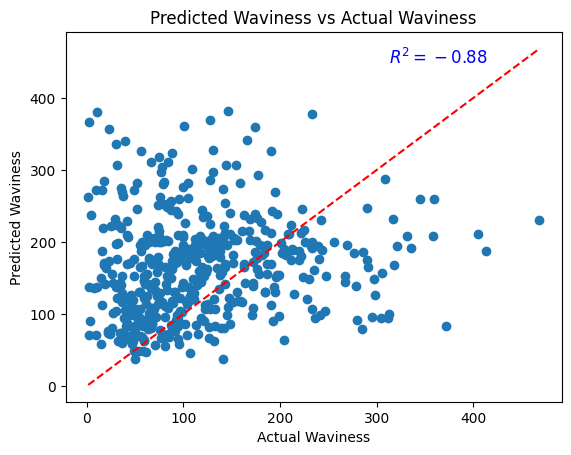

In [ ]:
# Exclude rows for every first curve with 0 waviness from the r2 calculation
filtered_shape_df = shape_df[shape_df['actual_waviness'] != 0]

# r2 score for predicted & actual waviness

actual_waviness = filtered_shape_df['actual_waviness'].values
predicted_waviness = filtered_shape_df['predicted_waviness'].values

r2_waviness = r2_score(actual_waviness, predicted_waviness)

plt.scatter(actual_waviness, predicted_waviness)
plt.xlabel('Actual Waviness')
plt.ylabel('Predicted Waviness')
plt.title('Predicted Waviness vs Actual Waviness')

# Add a diagonal line to visualize a perfect match between actual and predicted values
min_val = min(actual_waviness.min(), predicted_waviness.min())
max_val = max(actual_waviness.max(), predicted_waviness.max())
plt.plot([min_val, max_val], [min_val, max_val], color='red', linestyle='--')

# Add the r2 score to the plot
plt.text(max_val - (max_val - min_val) / 3, max_val - 20, r'$R^2 = {:.2f}$'.format(r2_waviness), fontsize=12, color='blue')

plt.show()

<ipython-input-52-9c10c5aa6019>:56: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  sorted_indices = np.argsort(all_outputs_np_denorm_labelled[mask_act][:, 0, 5].astype(np.int))


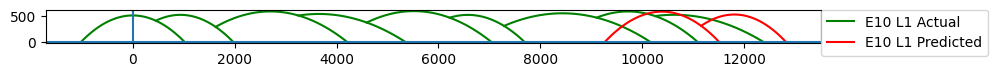

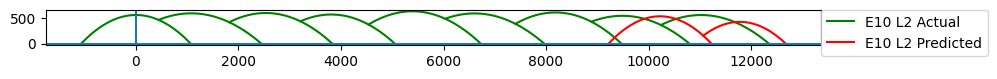

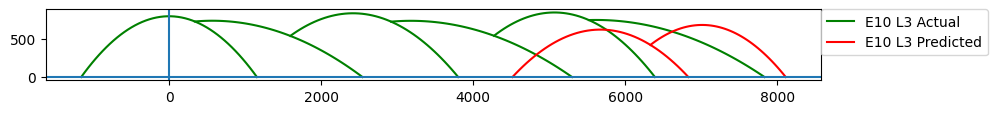

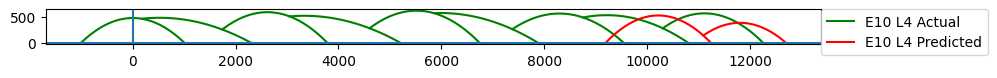

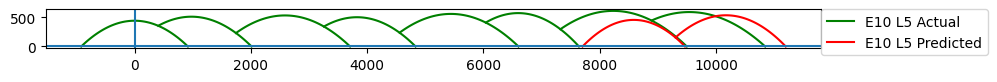

...

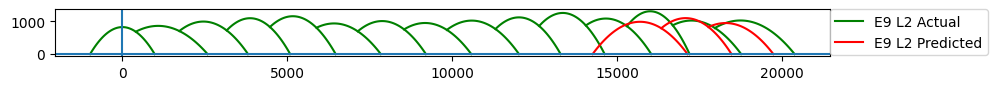

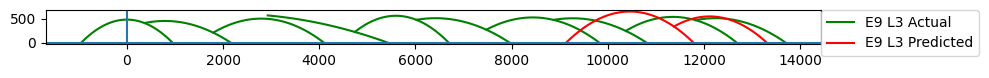

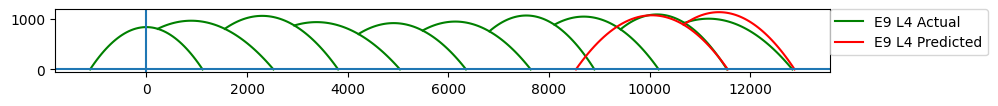

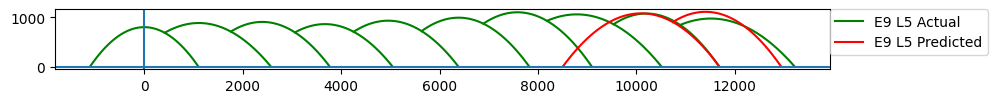

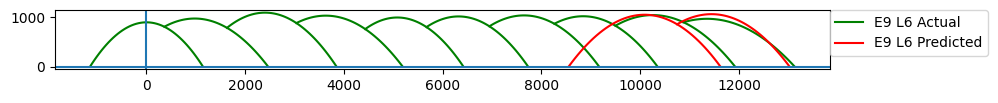

In [ ]:
unique_sample_numbers = np.unique(test_predictions_denorm_labelled[:, 0, 3])
unique_layer_numbers = np.unique(test_predictions_denorm_labelled[:, 0, 4])

all_outputs_np_denorm_labelled = np.concatenate((train_outputs_np_denorm_labelled, val_outputs_np_denorm_labelled, test_outputs_np_denorm_labelled), axis=0)
all_outputs_coef = np.concatenate((train_outputs_coef, val_outputs_coef, test_outputs_coef), axis=0)

for sample_number in unique_sample_numbers:
    for layer_number in unique_layer_numbers:
        sample_mask_pred = test_predictions_denorm_labelled[:, 0, 3] == sample_number
        layer_mask_pred = test_predictions_denorm_labelled[:, 0, 4] == layer_number
        mask_pred = np.logical_and(sample_mask_pred, layer_mask_pred)

        sample_mask_act = all_outputs_np_denorm_labelled[:, 0, 3] == sample_number
        layer_mask_act = all_outputs_np_denorm_labelled[:, 0, 4] == layer_number
        mask_act = np.logical_and(sample_mask_act, layer_mask_act)

        if np.any(mask_pred) or np.any(mask_act):
            coef_pred = []
            root_points_pred = []
            cross_points_pred = []
            point_chain_pred = []
            coef_act = []
            root_points_act = []
            cross_points_act = []
            point_chain_act = []
            hatch_spacing = process_parameters.loc[sample_number, 'Hatching Spacing']
            x_range = np.arange(-10, 11)

            if np.any(mask_pred):
                test_filtered_pred = test_predictions_denorm_labelled[mask_pred]
                pred_coef_filtered = pred_coef[mask_pred]

                for i in range(len(test_filtered_pred)):
                    try:
                        xy_offset = hatch_spacing * int(test_filtered_pred[i,0,5])
                        a, b, c = pred_coef_filtered[i][0]
                        y_vals = a * x_range ** 2 + b * x_range + c
                        points = np.stack((x_range, y_vals), axis=-1)
                        coefficient = np.polyfit(points[:, 0:1].flatten()+xy_offset, points[:, 1:2].flatten(), 2, full=False)
                        p = np.poly1d(coefficient)
                        roots = np.roots(coefficient)
                        root_points_pred.append(roots)
                        coef_pred.append(coefficient)
                        if i != 0:
                            intersect_point = np.roots(coef_pred[i - 1] - coef_pred[i])
                            intersect_point = intersect_point[p(intersect_point) > 0]
                            cross_points_pred.append(np.max(intersect_point[(intersect_point >= np.min(root_points_pred[i-1])) & (intersect_point <= np.max(root_points_pred[i-1]))]))
                    except (ValueError, IndexError) as e:
                        print(f"Error occurred for Sample Number: {sample_number}, Layer Number: {layer_number}")
                        continue

                point_chain_pred = np.concatenate(([np.min(root_points_pred[0])], cross_points_pred, [np.max(root_points_pred[-1])]))
                
            
            if np.any(mask_act):
                sorted_indices = np.argsort(all_outputs_np_denorm_labelled[mask_act][:, 0, 5].astype(np.int))
                test_filtered_act = all_outputs_np_denorm_labelled[mask_act][sorted_indices]
                act_coef_filtered = all_outputs_coef[mask_act]

                for i in range(len(test_filtered_act)):
                    try:
                        xy_offset = hatch_spacing * int(test_filtered_act[i,0,5])
                        a, b, c = act_coef_filtered[i][0]
                        y_vals = a * x_range ** 2 + b * x_range + c
                        points = np.stack((x_range, y_vals), axis=-1)
                        coefficient = np.polyfit(points[:, 0:1].flatten()+xy_offset, points[:, 1:2].flatten(), 2, full=False)
                        if np.any(~np.isfinite(coefficient)):
                            raise ValueError("Invalid coefficient array")
                        p = np.poly1d(coefficient)
                        roots = np.roots(coefficient)
                        root_points_act.append(roots)
                        coef_act.append(coefficient)
                        if i != 0:
                            intersect_point = np.roots(coef_act[i - 1] - coef_act[i])
                            intersect_point = intersect_point[p(intersect_point) > 0]
                            cross_points_act.append(np.max(intersect_point[(intersect_point >= np.min(root_points_act[i-1])) & (intersect_point <= np.max(root_points_act[i-1]))]))
                    except (ValueError, IndexError) as e:
                        print(f"Error occurred for Sample Number: {sample_number}, Layer Number: {layer_number}")
                        continue

                point_chain_act = np.concatenate(([np.min(root_points_act[0])], cross_points_act, [np.max(root_points_act[-1])]))
                #plt_act = PlotGraph(coef_act, point_chain_act, root_points_act, sample_number, layer_number, color='green')
            
            if np.any(mask_act) and np.any(mask_pred):
                  plt_combined = PlotGraph([coef_act, coef_pred], [point_chain_act, point_chain_pred], [root_points_act, root_points_pred],
                                          sample_number, layer_number, colors=['green', 'red'])
                  plt_combined.plot_ax()

In [ ]:
unique_sample_numbers = np.unique(test_predictions_denorm_labelled[:, 0, 3])
unique_layer_numbers = np.unique(test_predictions_denorm_labelled[:, 0, 4])

for sample_number in unique_sample_numbers:
    for layer_number in unique_layer_numbers:
        sample_mask_pred = test_predictions_denorm_labelled[:, 0, 3] == sample_number
        layer_mask_pred = test_predictions_denorm_labelled[:, 0, 4] == layer_number
        mask_pred = np.logical_and(sample_mask_pred, layer_mask_pred)

        sample_mask_act = test_outputs_np_denorm_labelled[:, 0, 3] == sample_number
        layer_mask_act = test_outputs_np_denorm_labelled[:, 0, 4] == layer_number
        mask_act = np.logical_and(sample_mask_act, layer_mask_act)

        if np.any(mask_pred) or np.any(mask_act):
            coef_pred = []
            root_points_pred = []
            cross_points_pred = []
            point_chain_pred = []
            coef_act = []
            root_points_act = []
            cross_points_act = []
            point_chain_act = []
            hatch_spacing = process_parameters.loc[sample_number, 'Hatching Spacing']
            x_range = np.arange(-10, 11)

            if np.any(mask_pred):
                test_filtered_pred = test_predictions_denorm_labelled[mask_pred]
                pred_coef_filtered = pred_coef[mask_pred]

                for i in range(len(test_filtered_pred)):
                    try:
                        xy_offset = hatch_spacing * int(test_filtered_pred[i,0,5])
                        a, b, c = pred_coef_filtered[i][0]
                        y_vals = a * x_range ** 2 + b * x_range + c
                        points = np.stack((x_range, y_vals), axis=-1)
                        coefficient = np.polyfit(points[:, 0:1].flatten()+xy_offset, points[:, 1:2].flatten(), 2, full=False)
                        p = np.poly1d(coefficient)
                        roots = np.roots(coefficient)
                        root_points_pred.append(roots)
                        coef_pred.append(coefficient)
                        if i != 0:
                            intersect_point = np.roots(coef_pred[i - 1] - coef_pred[i])
                            intersect_point = intersect_point[p(intersect_point) > 0]
                            cross_points_pred.append(np.max(intersect_point[(intersect_point >= np.min(root_points_pred[i-1])) & (intersect_point <= np.max(root_points_pred[i-1]))]))
                    except (ValueError, IndexError) as e:
                        print(f"Error occurred for Sample Number: {sample_number}, Layer Number: {layer_number}")
                        continue

                point_chain_pred = np.concatenate(([np.min(root_points_pred[0])], cross_points_pred, [np.max(root_points_pred[-1])]))
                
            
            if np.any(mask_act):
                test_filtered_act = test_outputs_np_denorm_labelled[mask_act]
                act_coef_filtered = test_outputs_coef[mask_act]

                for i in range(len(test_filtered_act)):
                    try:
                        xy_offset = hatch_spacing * int(test_filtered_act[i,0,5])
                        a, b, c = act_coef_filtered[i][0]
                        y_vals = a * x_range ** 2 + b * x_range + c
                        points = np.stack((x_range, y_vals), axis=-1)
                        coefficient = np.polyfit(points[:, 0:1].flatten()+xy_offset, points[:, 1:2].flatten(), 2, full=False)
                        if np.any(~np.isfinite(coefficient)):
                            raise ValueError("Invalid coefficient array")
                        p = np.poly1d(coefficient)
                        roots = np.roots(coefficient)
                        root_points_act.append(roots)
                        coef_act.append(coefficient)
                        if i != 0:
                            intersect_point = np.roots(coef_act[i - 1] - coef_act[i])
                            intersect_point = intersect_point[p(intersect_point) > 0]
                            cross_points_act.append(np.max(intersect_point[(intersect_point >= np.min(root_points_act[i-1])) & (intersect_point <= np.max(root_points_act[i-1]))]))
                    except (ValueError, IndexError) as e:
                        print(f"Error occurred for Sample Number: {sample_number}, Layer Number: {layer_number}")
                        continue

                point_chain_act = np.concatenate(([np.min(root_points_act[0])], cross_points_act, [np.max(root_points_act[-1])]))
                #plt_act = PlotGraph(coef_act, point_chain_act, root_points_act, sample_number, layer_number, color='green')
            
            if np.any(mask_act) and np.any(mask_pred):
                  plt_combined = PlotGraph([coef_act, coef_pred], [point_chain_act, point_chain_pred], [root_points_act, root_points_pred],
                                          sample_number, layer_number, colors=['green', 'red'])
                  plt_combined.plot_ax()

# Prediction of Geometry with Different Laser Power & Hatch Spacing Value

In [ ]:
new_df

,Laser power,Scanning speed,Powder mass flow rate,Hatching Spacing,Z-incremental value,a,b,c,sample_name,layer_num
1541,1300.0,1800.0,12.734,0.0,1710.0,0.000000,0.000000e+00,0.000000,E44,L4
1542,1300.0,1800.0,12.734,1178.0,1710.0,-0.000631,9.056188e-16,472.469110,E44,L4
1543,1300.0,1800.0,12.734,2356.0,1710.0,-0.000348,-1.819560e-01,550.028270,E44,L4
1544,1300.0,1800.0,12.734,3534.0,1710.0,-0.000584,-3.438096e-01,617.567866,E44,L4
1545,1300.0,1800.0,12.734,4712.0,1710.0,-0.000414,-2.757525e-01,581.276042,E44,L4
1546,1300.0,1800.0,12.734,5890.0,1710.0,-0.000503,-3.082396e-01,652.064364,E44,L4
1547,1300.0,1800.0,12.734,7068.0,1710.0,-0.000474,-2.745334e-01,600.445728,E44,L4
1548,1300.0,1800.0,12.734,8246.0,1710.0,-0.000582,-3.544306e-01,634.615179,E44,L4
1549,1300.0,1800.0,12.734,9424.0,1710.0,-0.000591,-3.407538e-01,575.393080,E44,L4
1550,1300.0,1800.0,12.734,10602.0,1710.0,-0.000455,-2.966861e-01,613.272920,E44,L4


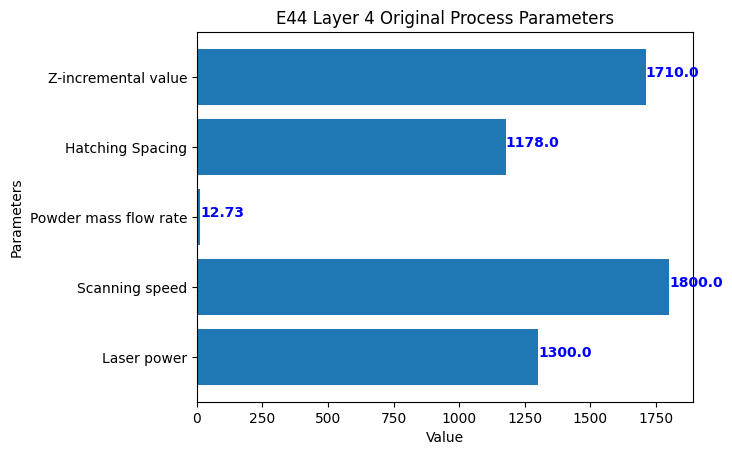

In [ ]:
# Select the row you want to plot
row = new_df.iloc[1]

# Extract the values of the process parameters
process_params = ['Laser power', 'Scanning speed', 'Powder mass flow rate', 'Hatching Spacing', 'Z-incremental value']
values = row[process_params]

# Create a horizontal bar chart
plt.barh(process_params, values)

# Add the values to the chart
for i, v in enumerate(values):
    plt.text(v, i, str(round(v,2)), color='blue', fontweight='bold')

# Set the title and labels
plt.title('E44 Layer 4 Original Process Parameters')
plt.xlabel('Value')
plt.ylabel('Parameters')

# Display the chart
plt.show()

In [ ]:
new_df["Powder mass flow rate"] += 7.266
new_df["Laser power"] += 200

new_df

,Laser power,Scanning speed,Powder mass flow rate,Hatching Spacing,Z-incremental value,a,b,c
1541,1500.0,1800.0,20.0,0.0,1710.0,0.000000,0.000000e+00,0.000000
1542,1500.0,1800.0,20.0,1178.0,1710.0,-0.000631,9.056188e-16,472.469110
1543,1500.0,1800.0,20.0,2356.0,1710.0,-0.000348,-1.819560e-01,550.028270
1544,1500.0,1800.0,20.0,3534.0,1710.0,-0.000584,-3.438096e-01,617.567866
1545,1500.0,1800.0,20.0,4712.0,1710.0,-0.000414,-2.757525e-01,581.276042
1546,1500.0,1800.0,20.0,5890.0,1710.0,-0.000503,-3.082396e-01,652.064364
1547,1500.0,1800.0,20.0,7068.0,1710.0,-0.000474,-2.745334e-01,600.445728
1548,1500.0,1800.0,20.0,8246.0,1710.0,-0.000582,-3.544306e-01,634.615179
1549,1500.0,1800.0,20.0,9424.0,1710.0,-0.000591,-3.407538e-01,575.393080
1550,1500.0,1800.0,20.0,10602.0,1710.0,-0.000455,-2.966861e-01,613.272920


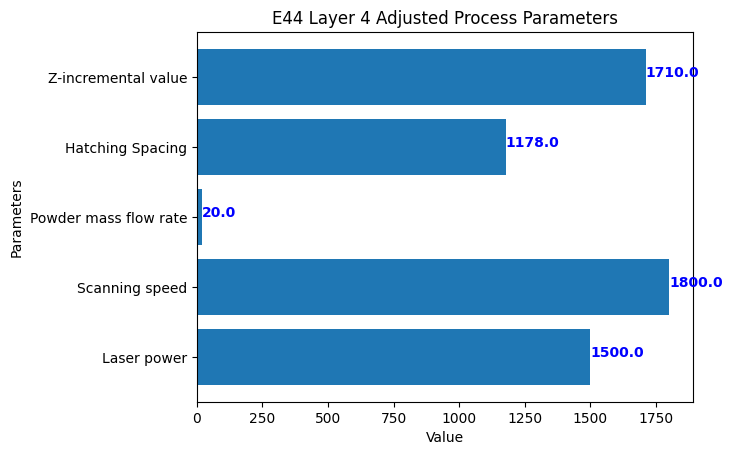

In [ ]:
# Select the row you want to plot
row = new_df.iloc[1]

# Extract the values of the process parameters
process_params = ['Laser power', 'Scanning speed', 'Powder mass flow rate', 'Hatching Spacing', 'Z-incremental value']
values = row[process_params]

# Create a horizontal bar chart
plt.barh(process_params, values)

# Add the values to the chart
for i, v in enumerate(values):
    plt.text(v, i, str(round(v,2)), color='blue', fontweight='bold')

# Set the title and labels
plt.title('E44 Layer 4 Adjusted Process Parameters')
plt.xlabel('Value')
plt.ylabel('Parameters')

# Display the chart
plt.show()

In [ ]:
new_test_identity = new_df[['sample_name','layer_num']]

In [ ]:
# Get the number of rows in the dataframe
num_rows = new_test_identity.shape[0]

# Create a new column 'curve_num' with values from 0 to the last row number
new_test_identity['curve_num'] = range(num_rows)

new_test_identity

<ipython-input-570-ede5847e94c1>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_test_identity['curve_num'] = range(num_rows)


,sample_name,layer_num,curve_num
1541,E44,L4,0
1542,E44,L4,1
1543,E44,L4,2
1544,E44,L4,3
1545,E44,L4,4
1546,E44,L4,5
1547,E44,L4,6
1548,E44,L4,7
1549,E44,L4,8
1550,E44,L4,9


In [ ]:
new_df=new_df.drop(['sample_name','layer_num'],axis=1)
new_df

,Laser power,Scanning speed,Powder mass flow rate,Hatching Spacing,Z-incremental value,a,b,c
1541,1300.0,1800.0,12.734,0.0,1710.0,0.000000,0.000000e+00,0.000000
1542,1300.0,1800.0,12.734,1178.0,1710.0,-0.000631,9.056188e-16,472.469110
1543,1300.0,1800.0,12.734,2356.0,1710.0,-0.000348,-1.819560e-01,550.028270
1544,1300.0,1800.0,12.734,3534.0,1710.0,-0.000584,-3.438096e-01,617.567866
1545,1300.0,1800.0,12.734,4712.0,1710.0,-0.000414,-2.757525e-01,581.276042
1546,1300.0,1800.0,12.734,5890.0,1710.0,-0.000503,-3.082396e-01,652.064364
1547,1300.0,1800.0,12.734,7068.0,1710.0,-0.000474,-2.745334e-01,600.445728
1548,1300.0,1800.0,12.734,8246.0,1710.0,-0.000582,-3.544306e-01,634.615179
1549,1300.0,1800.0,12.734,9424.0,1710.0,-0.000591,-3.407538e-01,575.393080
1550,1300.0,1800.0,12.734,10602.0,1710.0,-0.000455,-2.966861e-01,613.272920


In [ ]:
new_df_norm = process_parameters_scaler.transform(new_df)

In [ ]:
# Convert the numpy array to a PyTorch tensor
new_df_tensor = torch.tensor(new_df_norm, dtype=torch.float32)

In [ ]:
# Load the saved model
model = LSTMModel(input_size, hidden_size, output_size, num_layers, dropout)
model.load_state_dict(torch.load("lstm_model.pth"))

<All keys matched successfully>

In [ ]:
# Set the model to evaluation mode
model.eval()

# Pass the new input tensor through the model
with torch.no_grad():
    new_output_tensor = model(new_df_tensor.unsqueeze(1))

In [ ]:
# Convert the output tensor to a NumPy array
new_output_data = new_output_tensor.squeeze(1).numpy()
new_output_data

array([[0.5648489 , 0.45048428, 0.49702358],
       [0.6593172 , 0.41077542, 0.48996055],
       [0.7089251 , 0.405976  , 0.5149794 ],
       [0.6783819 , 0.37648305, 0.53752947],
       [0.7090117 , 0.39391607, 0.5162163 ],
       [0.6973234 , 0.38387978, 0.54551196],
       [0.7044282 , 0.3919029 , 0.51868945],
       [0.68396634, 0.37749606, 0.5372996 ],
       [0.68437207, 0.38267368, 0.50734156],
       [0.70621026, 0.39204556, 0.5223718 ]], dtype=float32)

In [ ]:
new_output_data_denorm = scaler.inverse_transform(new_output_data)
# Reshape the array to shape (10, 1, 3)
arr_3d = new_output_data_denorm .reshape((10, 1, 3))

In [ ]:
# Convert the new_test_identity DataFrame to a NumPy array and reshape it to the required dimensions
new_test_identity_np = new_test_identity.to_numpy().reshape(10, 1, -1)

# Concatenate arr_3d and new_test_identity_np along the second axis
final_arr = np.concatenate((arr_3d.astype('object'), new_test_identity_np), axis=2)
final_arr

array([[[-0.0007500294013880193, -0.007846466265618801,
         763.7808227539062, 'E44', 'L4', 0]],

       [[-0.0005995362298563123, -0.1539086401462555, 752.94921875,
         'E44', 'L4', 1]],

       [[-0.0005205080378800631, -0.17156250774860382,
         791.3170776367188, 'E44', 'L4', 2]],

       [[-0.0005691650439985096, -0.2800472378730774, 825.89892578125,
         'E44', 'L4', 3]],

       [[-0.00052037020213902, -0.21592287719249725, 793.2138671875,
         'E44', 'L4', 4]],

       [[-0.0005389902507886291, -0.2528396248817444, 838.1405639648438,
         'E44', 'L4', 5]],

       [[-0.0005276718875393271, -0.22332799434661865,
         797.0066528320312, 'E44', 'L4', 6]],

       [[-0.000560268759727478, -0.27632102370262146, 825.5463256835938,
         'E44', 'L4', 7]],

       [[-0.0005596224218606949, -0.2572760581970215, 779.60400390625,
         'E44', 'L4', 8]],

       [[-0.0005248329835012555, -0.2228032350540161, 802.65380859375,
         'E44', 'L4', 9]]], d

In [ ]:
final_arr_coef = final_arr[:, :, :3].astype(float)
final_arr_coef

array([[[-7.50029401e-04, -7.84646627e-03,  7.63780823e+02]],

       [[-5.99536230e-04, -1.53908640e-01,  7.52949219e+02]],

       [[-5.20508038e-04, -1.71562508e-01,  7.91317078e+02]],

       [[-5.69165044e-04, -2.80047238e-01,  8.25898926e+02]],

       [[-5.20370202e-04, -2.15922877e-01,  7.93213867e+02]],

       [[-5.38990251e-04, -2.52839625e-01,  8.38140564e+02]],

       [[-5.27671888e-04, -2.23327994e-01,  7.97006653e+02]],

       [[-5.60268760e-04, -2.76321024e-01,  8.25546326e+02]],

       [[-5.59622422e-04, -2.57276058e-01,  7.79604004e+02]],

       [[-5.24832984e-04, -2.22803235e-01,  8.02653809e+02]]])

<ipython-input-636-31a74c6a8693>:62: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  sorted_indices = np.argsort(all_outputs_np_denorm_labelled[mask_act][:, 0, 5].astype(np.int))


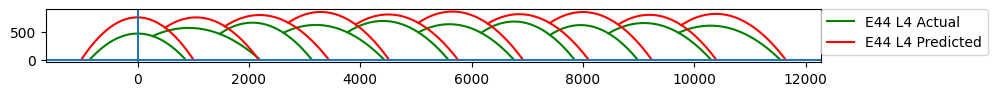

In [ ]:
unique_sample_numbers = np.unique(final_arr[:, 0, 3])
unique_layer_numbers = np.unique(final_arr[:, 0, 4])

all_outputs_np_denorm_labelled = np.concatenate((train_outputs_np_denorm_labelled, val_outputs_np_denorm_labelled, test_outputs_np_denorm_labelled), axis=0)
all_outputs_coef = np.concatenate((train_outputs_coef, val_outputs_coef, test_outputs_coef), axis=0)



for sample_number in unique_sample_numbers:
    for layer_number in unique_layer_numbers:
        sample_mask_pred = final_arr[:, 0, 3] == sample_number
        layer_mask_pred = final_arr[:, 0, 4] == layer_number
        mask_pred = np.logical_and(sample_mask_pred, layer_mask_pred)

        sample_mask_act = all_outputs_np_denorm_labelled[:, 0, 3] == sample_number
        layer_mask_act = all_outputs_np_denorm_labelled[:, 0, 4] == layer_number
        mask_act = np.logical_and(sample_mask_act, layer_mask_act)

        act_coef_filtered = all_outputs_coef[mask_act]
        test_filtered_act = all_outputs_np_denorm_labelled[mask_act]

        if np.any(mask_pred) or np.any(mask_act):
            coef_pred = []
            root_points_pred = []
            cross_points_pred = []
            point_chain_pred = []
            coef_act = []
            root_points_act = []
            cross_points_act = []
            point_chain_act = []
            hatch_spacing = process_parameters.loc[sample_number, 'Hatching Spacing']
            x_range = np.arange(-10, 11)

            if np.any(mask_pred):
                test_filtered_pred = final_arr[mask_pred]
                pred_coef_filtered = final_arr_coef[mask_pred]
                max_point_y = []  # Create an empty list to store the max heights of the predicted curves
                for i in range(len(test_filtered_pred)):
                    try:
                        xy_offset = hatch_spacing * int(test_filtered_pred[i,0,5])
                        a, b, c = pred_coef_filtered[i][0]
                        y_vals = a * x_range ** 2 + b * x_range + c
                        points = np.stack((x_range, y_vals), axis=-1)
                        coefficient = np.polyfit(points[:, 0:1].flatten()+xy_offset, points[:, 1:2].flatten(), 2, full=False)
                        p = np.poly1d(coefficient)
                        roots = np.roots(coefficient)
                        root_points_pred.append(roots)
                        max_point_y.append(p(np.roots(np.poly1d(coefficient).deriv())))
                        coef_pred.append(coefficient)
                        if i != 0:
                            intersect_point = np.roots(coef_pred[i - 1] - coef_pred[i])
                            intersect_point = intersect_point[p(intersect_point) > 0]
                            cross_points_pred.append(np.max(intersect_point[(intersect_point >= np.min(root_points_pred[i-1])) & (intersect_point <= np.max(root_points_pred[i-1]))]))
                    except (ValueError, IndexError) as e:
                        print(f"Error occurred for Sample Number: {sample_number}, Layer Number: {layer_number}")
                        continue

                point_chain_pred = np.concatenate(([np.min(root_points_pred[0])], cross_points_pred, [np.max(root_points_pred[-1])]))
                
            
            if np.any(mask_act):
                sorted_indices = np.argsort(all_outputs_np_denorm_labelled[mask_act][:, 0, 5].astype(np.int))
                test_filtered_act = all_outputs_np_denorm_labelled[mask_act][sorted_indices]
                act_coef_filtered = all_outputs_coef[mask_act]
                max_point_y_act = [] # Create an empty list to store the max heights of the actual curves


                for i in range(len(test_filtered_act)):
                    try:
                        xy_offset = hatch_spacing * int(test_filtered_act[i,0,5])
                        a, b, c = act_coef_filtered[i][0]
                        y_vals = a * x_range ** 2 + b * x_range + c
                        points = np.stack((x_range, y_vals), axis=-1)
                        coefficient = np.polyfit(points[:, 0:1].flatten()+xy_offset, points[:, 1:2].flatten(), 2, full=False)
                        if np.any(~np.isfinite(coefficient)):
                            raise ValueError("Invalid coefficient array")
                        p = np.poly1d(coefficient)
                        roots = np.roots(coefficient)
                        root_points_act.append(roots)
                        max_point_y_act.append(p(np.roots(np.poly1d(coefficient).deriv())))  # Append the max height for the actual curve
                        coef_act.append(coefficient)
                        if i != 0:
                            intersect_point = np.roots(coef_act[i - 1] - coef_act[i])
                            intersect_point = intersect_point[p(intersect_point) > 0]
                            cross_points_act.append(np.max(intersect_point[(intersect_point >= np.min(root_points_act[i-1])) & (intersect_point <= np.max(root_points_act[i-1]))]))
                    except (ValueError, IndexError) as e:
                        print(f"Error occurred for Sample Number: {sample_number}, Layer Number: {layer_number}")
                        continue

                point_chain_act = np.concatenate(([np.min(root_points_act[0])], cross_points_act, [np.max(root_points_act[-1])]))
                #plt_act = PlotGraph(coef_act, point_chain_act, root_points_act, sample_number, layer_number, color='green')
            
            if np.any(mask_act) and np.any(mask_pred):
                  plt_combined = PlotGraph([coef_act, coef_pred], [point_chain_act, point_chain_pred], [root_points_act, root_points_pred],
                                          sample_number, layer_number, colors=['green', 'red'])
                  plt_combined.plot_ax()

            elif np.any(mask_act):
                  plt_act = PlotGraph(coef_act, point_chain_act, root_points_act, sample_number, layer_number, color='green')
                  plt_act.plot_ax()
            elif np.any(mask_pred):
                  plt_pred = PlotGraph(coef_pred, point_chain_pred, root_points_pred, sample_number, layer_number, color='red')
                  plt_pred.plot_ax()

In [ ]:
actual_height = max_point_y_act

# Calculate the standard deviation of the curve actual heights
actual_std_deviation = np.std(actual_height)
actual_std_deviation

62.41192723935

In [ ]:
original_pred_height = max_point_y

# Calculate the standard deviation of the curve heights for the original predicted heights
original_pred_std_deviation = np.std(original_pred_height)
original_pred_std_deviation

45.91932089018069

In [ ]:
new_pred_height = max_point_y

# Calculate the standard deviation of the curve heights for the new predicted heights
new_pred_std_deviation = np.std(new_pred_height)
new_pred_std_deviation

35.0563941151632

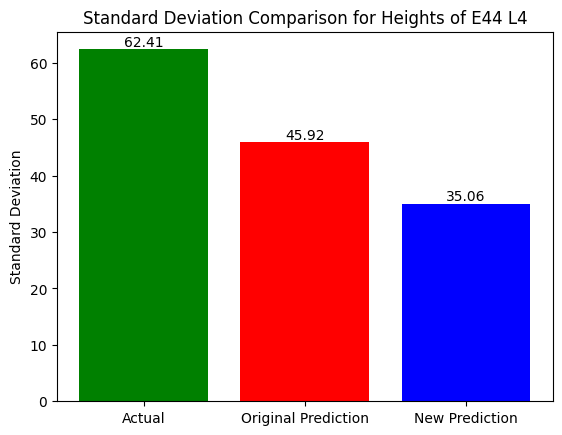

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Define the values for the bars
values = [actual_std_deviation , original_pred_std_deviation, new_pred_std_deviation]

# Define the labels for the bars
labels = ['Actual', 'Original Prediction', 'New Prediction']

# Set the x-axis tick positions
x_ticks = [0, 1, 2]

# Define colors for each bar
colors = ['green', 'red', 'blue']

# Create a figure and axis object
fig, ax = plt.subplots()

# Plot the bars with different colors
ax.bar(x_ticks, values, color=colors)

# Set the x-axis tick positions and labels
ax.set_xticks(x_ticks)
ax.set_xticklabels(labels)

# Set the y-axis label
ax.set_ylabel('Standard Deviation')

# Set the plot title
ax.set_title('Standard Deviation Comparison for Heights of E44 L4')

# Add value labels on top of each bar
for i, v in enumerate(values):
    ax.text(i, v, str(round(v, 2)), ha='center', va='bottom')

# Show the plot
plt.show()